In [ ]:
### Cosmology and astropy packages
from astropy.cosmology import FlatLambdaCDM
from astropy.units import Quantity
import astropy.coordinates as coord
import astropy.units as u
from astropy.table import Table

### Arrays, tables, plots
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

### SLSim functions
import slsim.Sources as sources
import slsim.Deflectors as deflectors
import slsim.Pipelines as pipelines
from slsim.Sources.SourceCatalogues.QuasarCatalog.quasar_pop import QuasarRate
from slsim.Lenses.lens_pop import LensPop

from slsim.ImageSimulation.image_simulation import (
    point_source_coordinate_properties,
    lens_image_series,
    rgb_image_from_image_list,
)
from slsim.Plots.plot_functions import create_image_montage_from_image_list
from slsim.Util.all_plotting_functions import make_contour
from slsim.LsstSciencePipeline.rubin_sim_pipeline import get_rubin_cadence
from slsim.Util.param_util import ellipticity2phi_q

### Readin, readout, paths
from contextlib import redirect_stdout
import io
from tqdm import tqdm
import json
from PIL import Image
import os

### recompile packages after each edit
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
# Compute absolute magnitude from apparent magnitude and redshift
def compute_absolute_magnitude(apparent_mag, redshift, cosmo):
    luminosity_distance = cosmo.luminosity_distance(redshift).to(u.pc).value
    absolute_mag = apparent_mag - 5 * (np.log10(luminosity_distance) - 1)
    return absolute_mag


def compute_apparent_magnitude(absolute_mag, redshift, cosmo):
    luminosity_distance = cosmo.luminosity_distance(redshift).to(u.pc).value
    apparent_mag = absolute_mag + 5 * (np.log10(luminosity_distance) - 1)
    return apparent_mag

## Lensed quasar population

This notebook shows how to simulate lensed quasar population with variability.

In [88]:
# define a cosmology
cosmo = FlatLambdaCDM(H0=70, Om0=0.3)


# define a sky area
galaxy_sky_area = Quantity(
    value=10, unit="deg2"
)  # this is the sky area over which galaxies are sampled
quasar_sky_area = Quantity(value=10, unit="deg2")
full_sky_area = Quantity(value=1000, unit="deg2")


# define limits in the intrinsic deflector and source population (in addition
# to the skypy config
# file)
kwargs_deflector_cut = {"band": "i", "band_max": 28, "z_min": 0.01, "z_max": 2.5}
kwargs_source_cut = {"band": "i", "band_max": 26, "z_min": 0.001, "z_max": 5.0}

In [89]:
# generate galaxy population using skypy pipeline.
galaxy_simulation_pipeline = pipelines.SkyPyPipeline(
    skypy_config=None,
    sky_area=galaxy_sky_area,
    filters=["u", "g", "r", "i", "z", "y"],
    cosmo=cosmo,
    z_min=0,
    z_max=4,
)

In [90]:
# Initiate deflector popiulation class
lens_galaxies_all = deflectors.AllLensGalaxies(
    red_galaxy_list=galaxy_simulation_pipeline.red_galaxies,
    blue_galaxy_list=galaxy_simulation_pipeline.blue_galaxies,
    kwargs_cut=kwargs_deflector_cut,
    kwargs_mass2light={},
    cosmo=cosmo,
    gamma_pl={"mean": 2, "std_dev": 0.16},
    sky_area=galaxy_sky_area,
)

lens_galaxies_ell = deflectors.EllipticalLensGalaxies(
    galaxy_list=galaxy_simulation_pipeline.red_galaxies,
    kwargs_cut=kwargs_deflector_cut,
    kwargs_mass2light={},
    cosmo=cosmo,
    sky_area=galaxy_sky_area,
    gamma_pl=dict(mean=2.0, std_dev=0.16),
)

/Users/padmavenkatraman/Documents/StrongLensing/slsim/slsim/Deflectors/DeflectorPopulation/all_lens_galaxies.py:56: UserWarning: Angular size is converted to arcsec because provided input_catalog_type is skypy. If this is not correct, please refer to the documentation of the class you are using
  red_galaxy_list = catalog_with_angular_size_in_arcsec(
/Users/padmavenkatraman/Documents/StrongLensing/slsim/slsim/Deflectors/DeflectorPopulation/all_lens_galaxies.py:59: UserWarning: Angular size is converted to arcsec because provided input_catalog_type is skypy. If this is not correct, please refer to the documentation of the class you are using
  blue_galaxy_list = catalog_with_angular_size_in_arcsec(
/Users/padmavenkatraman/Documents/StrongLensing/slsim/slsim/Deflectors/DeflectorPopulation/elliptical_lens_galaxies.py:48: UserWarning: Angular size is converted to arcsec because provided input_catalog_type is skypy. If this is not correct, please refer to the documentation of the class you 

In [6]:
# Initiate QuasarRate class to generate quasar sample.
quasar_class = QuasarRate(
    cosmo=cosmo,
    sky_area=quasar_sky_area,
    noise=True,
    redshifts=np.linspace(0.001, 5.01, 100),  # these redshifts are provided
    # to match general slsim redshift range in skypy pipeline.
)

In [7]:
# quasar sample with host galaxy
quasar_source_plus_galaxy = quasar_class.quasar_sample(
    m_min=15, m_max=28, host_galaxy=True
)

Matching quasars with host galaxies: 100%|██████████| 44720/44720 [00:23<00:00, 1924.53it/s]


In [8]:
quasar_source_plus_galaxy

z,M_i,ps_mag_i,M,coeff,ellipticity,physical_size,stellar_mass,angular_size,mag_g,mag_r,mag_i,mag_z,mag_y,vel_disp,black_hole_mass_exponent,eddington_ratio
,,,,,,kpc,,rad,,,,,,,,
float64,float64,float64,float64,float64[5],float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
2.6366285213189027,-18.84615805252786,26.994644450402784,-19.46711595970459,0.42051421419801316 .. 0.01411172982894154,0.3129868597206717,2.3669324569534034,10864577915.75799,1.4388918875741266e-06,27.68678092928788,27.569684085795576,27.375865583526764,27.398015567555884,27.28783188655181,78.05135857835859,6.7014767577836265,0.13720357699929672
2.1886865526503394,-20.77022771987185,24.61107507883324,-18.983841967411234,0.10228723031839007 .. 0.004679714829591337,0.5245218360530021,2.68620557038584,21500196778.58161,1.5742261758294503e-06,28.31751787432743,28.18249115814566,28.111617964085717,27.92663576083698,27.509072903817952,97.12322662544184,7.117325499986498,0.3086650113869923
1.0254075333399897,-15.660590736411459,27.94660406607543,-14.222053846850876,0.03830217208321976 .. 0.001748167447031689,0.08368789687704423,0.06926086926319963,265386503.54160935,4.168572894834839e-08,31.52755643448463,30.853270014465963,30.09616687999175,29.265038294362284,28.832889529619152,35.55411305932542,5.205747851911887,0.2278671773482202
1.025329153787858,-21.115854561335365,22.49121335457054,-20.130894153282547,0.11444572269582706 .. 0.0671502691588455,0.5552592828724954,2.3888033821772487,20594789743.035103,1.4377532521555568e-06,24.88730877254685,24.377887920604937,23.863292079902298,23.296135841409704,23.08969981170102,95.90217041739402,7.093258862729737,0.4481189244771534
0.6208420686921784,-16.009247191993342,26.41298718106632,-13.574085844524,0.15463454254613934 .. 0.0015566582713029493,0.14908657023749333,0.07567871587030392,173984467.4139094,5.4025954924266836e-08,30.783710574883017,29.514473757709965,28.468084990241408,28.085321225291466,27.784792676727463,34.185543698647784,5.13108042542011,0.3733606951405149
3.29229298970537,-20.9058398727814,25.433868947532048,-20.485026876386968,0.1423117736817306 .. 0.006051732772250883,0.9102324743036854,4.426824889607503,14858374128.05249,2.8692944425968636e-06,27.58590506474632,27.362524082520842,27.150904172485248,26.99804576455314,26.95932228884584,86.69752429723381,6.901319641739797,0.5758301554161613
2.195932092875692,-18.56334366167266,26.827438130334663,-19.12130884560511,0.3300370054998843 .. 0.2376850535818279,0.09187293787319284,2.9507773820452825,4554942948.309615,1.7302294723183653e-06,28.332331874211107,27.82953488493756,27.478123692454105,27.070941080331487,26.743827249378256,54.04064774664887,6.00216630412634,0.5278295239580799
2.546343481349763,-19.696532828259517,26.093333760252587,-19.245214148502544,0.25416386575923267 .. 0.06278716490904386,0.40269450837465615,2.9796215949099683,10594028784.224089,1.796707002821284e-06,27.90927207810851,27.71384622345195,27.492009604867217,27.43098453268993,27.211557707012975,77.23506896594102,6.681477992244802,0.31374762396242484


### We need to sample from the distribution below to get the driving variability parameters

/Users/padmavenkatraman/Documents/StrongLensing/slsim_env/lib/python3.11/site-packages/corner/core.py:846: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if xs[k1] is not None:
/Users/padmavenkatraman/Documents/StrongLensing/slsim_env/lib/python3.11/site-packages/corner/core.py:847: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  axes[k1, k1].axvline(xs[k1], **kwargs)
/Users/padmavenkatraman/Documents/StrongLensing/slsim_env/lib/python3.11/site-packages/corner/core.py:849: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consi

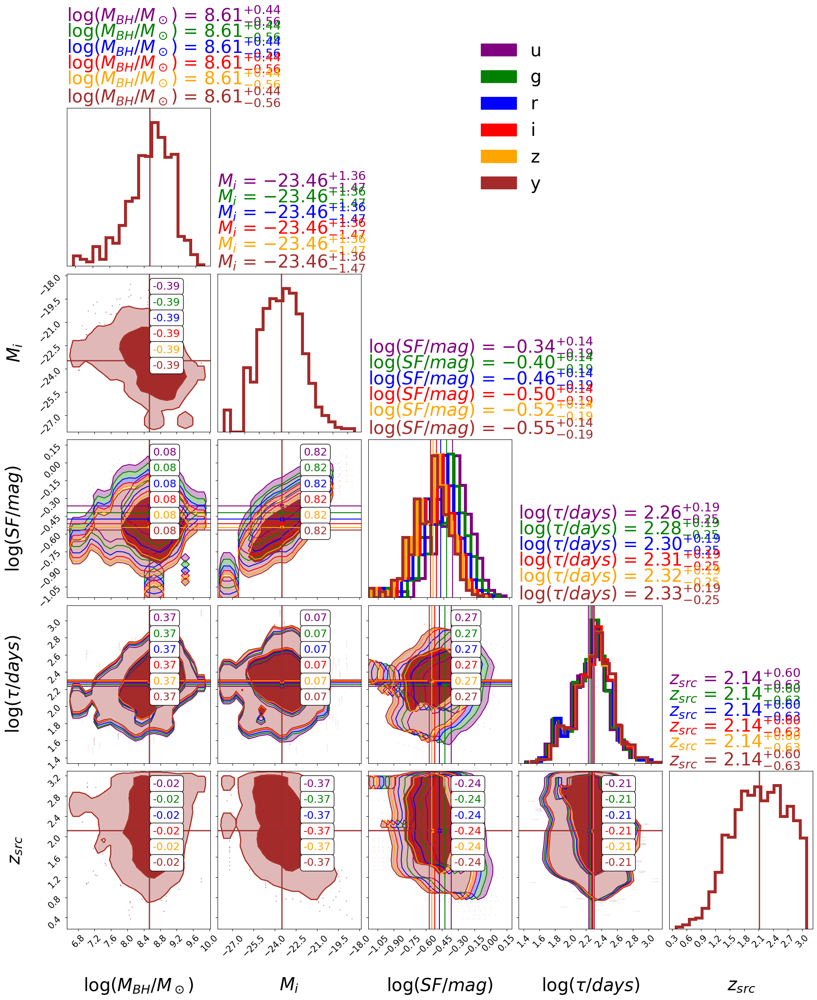

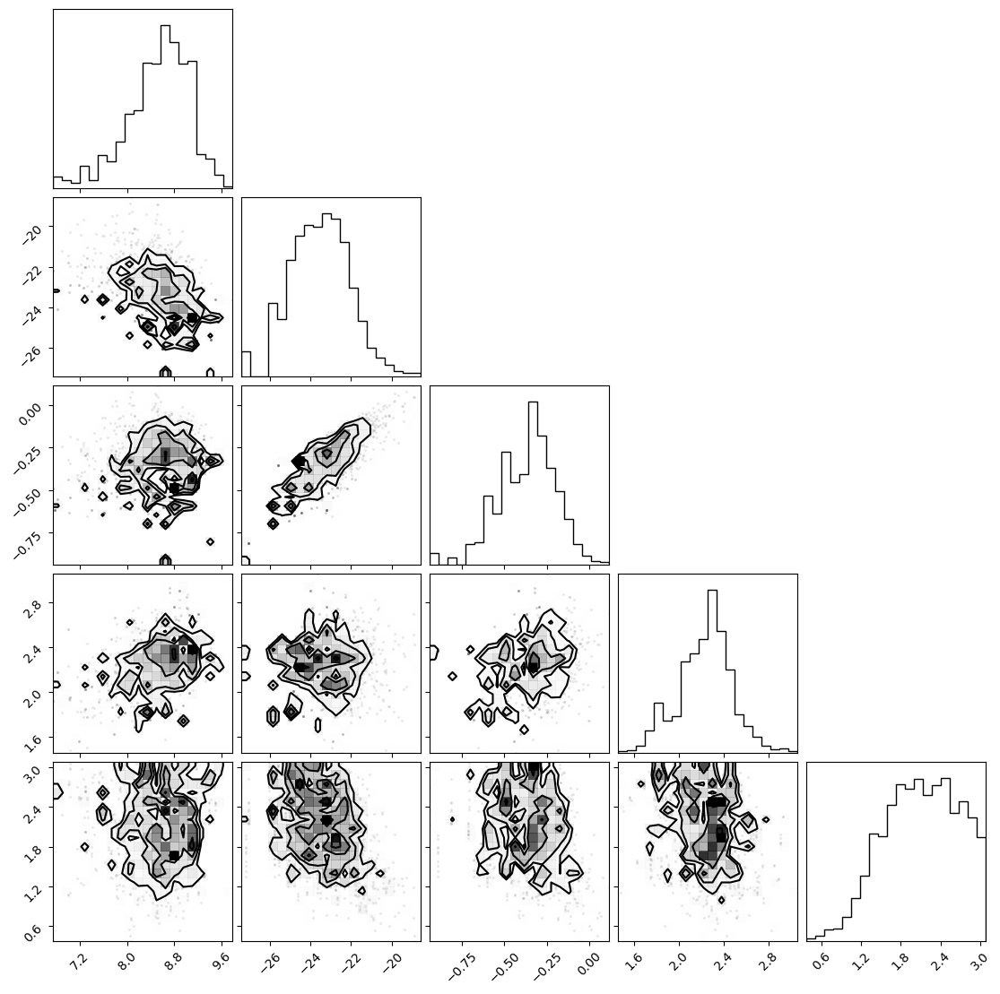

<Figure size 640x480 with 0 Axes>

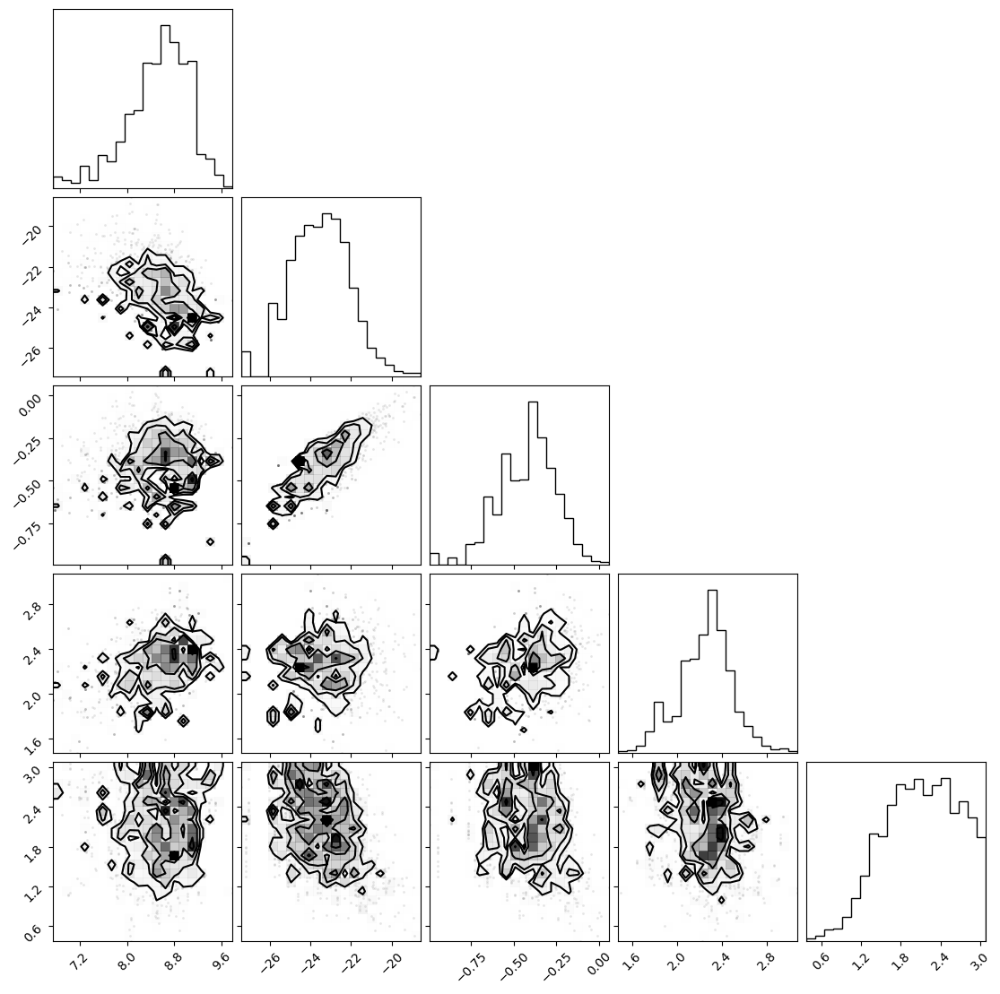

<Figure size 640x480 with 0 Axes>

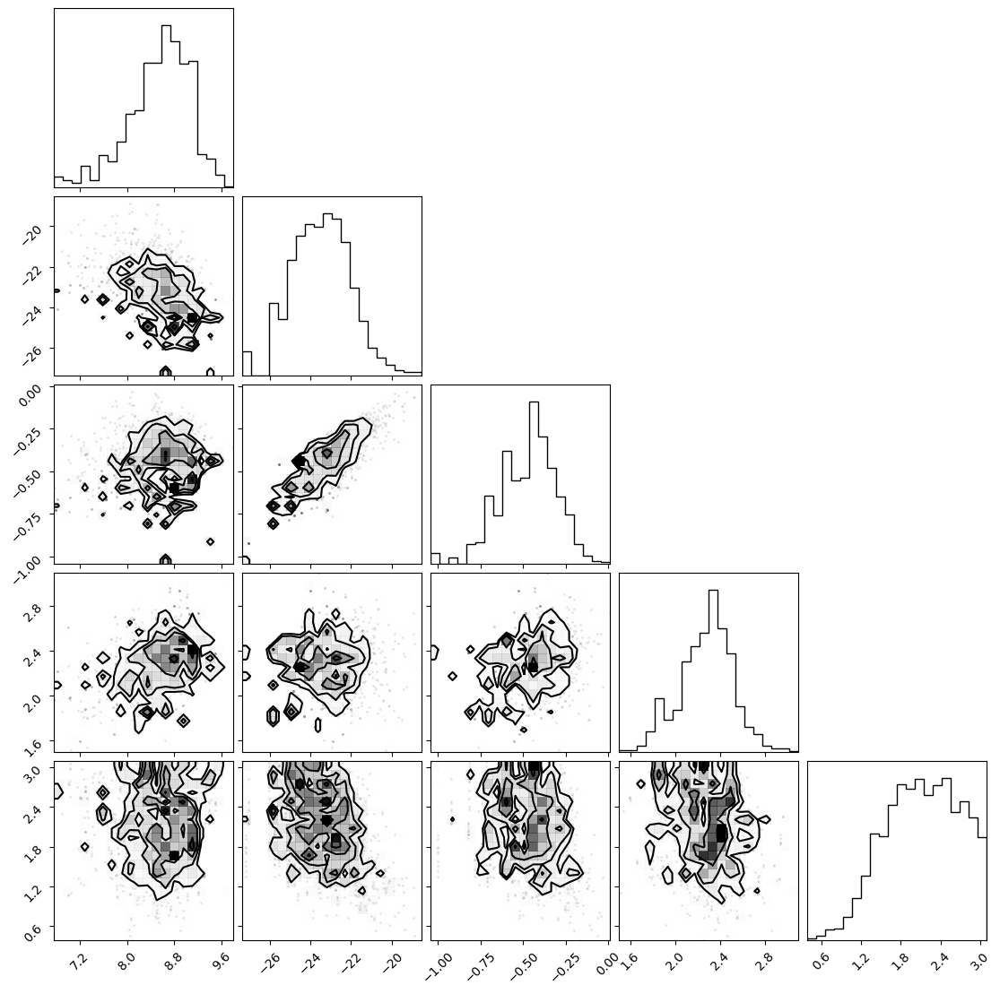

<Figure size 640x480 with 0 Axes>

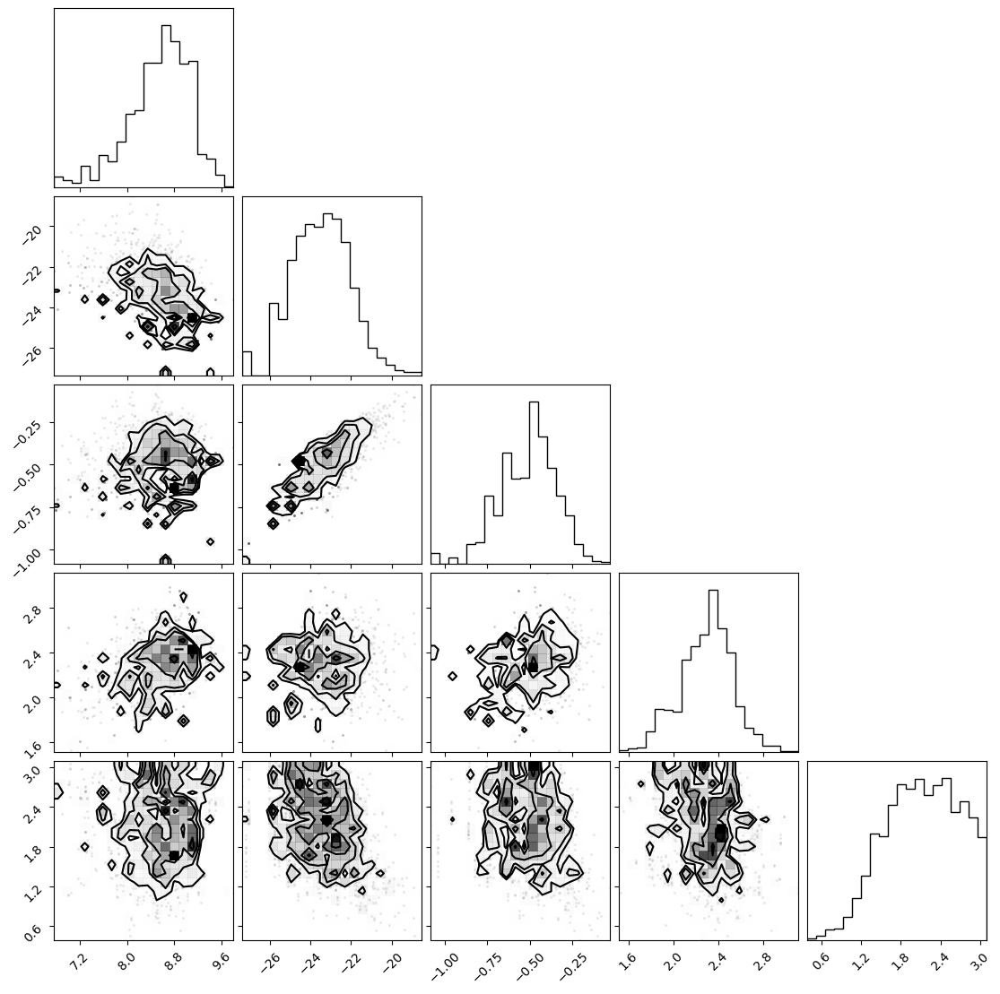

<Figure size 640x480 with 0 Axes>

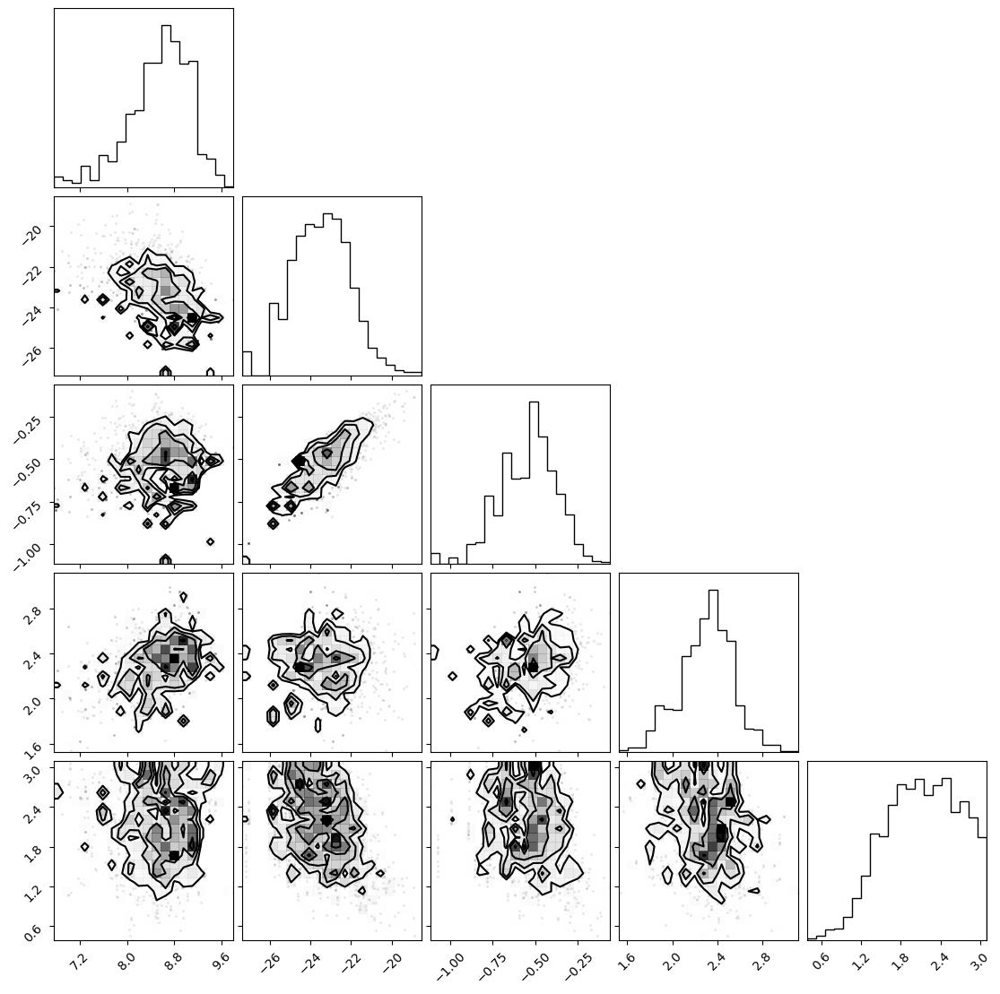

<Figure size 640x480 with 0 Axes>

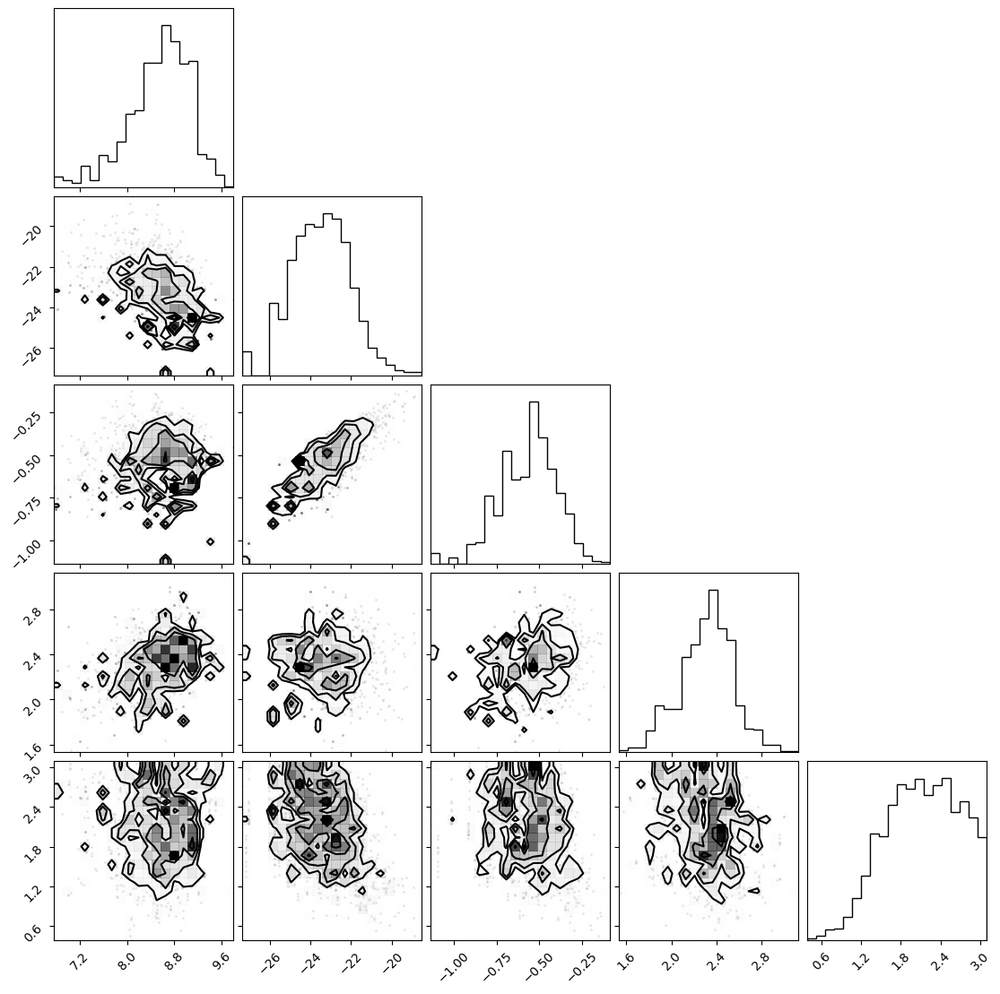

<Figure size 640x480 with 0 Axes>

In [9]:
# define the variability probability distribution
### reed in dc2 files
sources_dc2 = pd.read_csv("../../data/OM10/sources3.csv")
sources_dc2["bh_mass"] = np.log10(
    0.0049
    * sources_dc2["stellar_mass_bulge"]
    * (sources_dc2["stellar_mass_bulge"] / 1e11) ** (0.15)
)
bands = list("ugrizy")
for band in bands:
    sources_dc2[f"log_tau_{band}"] = np.log10(sources_dc2[f"tau_{band}"])
    sources_dc2[f"log_sf_{band}"] = np.log10(sources_dc2[f"sf_{band}"])
colors = ["purple", "green", "blue", "red", "orange", "brown"]
fig = make_contour(
    [
        sources_dc2[["bh_mass", "M_i", f"log_sf_{b}", f"log_tau_{b}", "ZSRC"]]
        for b in bands
    ],
    labels=[
        "$\log(M_{BH}/M_\odot)$",
        "$M_i$",
        "$ \log(SF / mag)$",
        "$\log(\\tau/days)$",
        "$z_{src}$",
    ],
    categories=bands,
    colors=colors,
    show_correlation=True,
    show_every_title=True,
)
# fig.savefig('../../../bh_var_corr.pdf', dpi=300)

In [10]:
# Prepare dictionary of agn variability kwargs
length_of_light_curve = 3850
variable_agn_kwarg_dict = {
    "length_of_light_curve": length_of_light_curve,
    "time_resolution": 1,
    # "log_breakpoint_frequency": 1 / 20,
    # "low_frequency_slope": 1,
    # "high_frequency_slope": 3,
    # "standard_deviation": 0.9,
}

kwargs_quasar = {
    "variability_model": "light_curve",
    "kwargs_variability": {"agn_lightcurve", "u", "g", "r", "i", "z", "y"},
    "agn_driving_variability_model": "bending_power_law",
    "agn_driving_kwargs_variability": variable_agn_kwarg_dict,
    "lightcurve_time": np.linspace(0, length_of_light_curve, length_of_light_curve),
    "r_resolution": 500,
    "corona_height": 10,
}
# Initiate source population class.
source_quasar_plus_galaxies = sources.PointPlusExtendedSources(
    point_plus_extended_sources_list=quasar_source_plus_galaxy,
    cosmo=cosmo,
    sky_area=quasar_sky_area,
    kwargs_cut=kwargs_source_cut,
    list_type="astropy_table",
    catalog_type="skypy",
    point_source_type="quasar",
    extended_source_type="single_sersic",
    point_source_kwargs=kwargs_quasar,
)

In [11]:
quasar_source_plus_galaxy.columns

<TableColumns names=('z','M_i','ps_mag_i','M','coeff','ellipticity','physical_size','stellar_mass','angular_size','mag_g','mag_r','mag_i','mag_z','mag_y','vel_disp','black_hole_mass_exponent','eddington_ratio')>

### Make the quasar lens population object

In [91]:
# Initiate LensPop class to generate lensed quasar pop.
quasar_lens_pop_ell = LensPop(
    deflector_population=lens_galaxies_ell,
    source_population=source_quasar_plus_galaxies,
    cosmo=cosmo,
    sky_area=full_sky_area,
)

quasar_lens_pop_all = LensPop(
    deflector_population=lens_galaxies_all,
    source_population=source_quasar_plus_galaxies,
    cosmo=cosmo,
    sky_area=full_sky_area,
)

### Check the variability model of the sources

## Draw lenses

In [ ]:
### LSST cuts: 'u': 23.9,'g':25.0, 'r':24.7, 'i':24.0, 'z':23.3, 'y':22.1
kwargs_lens_cuts = {
    "min_image_separation": 0.7,
    "max_image_separation": 10,
    # "second_brightest_image_cut": {"g": 25.0},
}
# drawing population
# the key difference in lens population drawing time is whether you ask for magnitude cuts or not I think?
quasar_lens_population = quasar_lens_pop_ell.draw_population(
    speed_factor=1000, kwargs_lens_cuts=kwargs_lens_cuts
)

Drawing lens population: 100%|██████████| 43865/43865 [00:14<00:00, 3118.14it/s]


In [92]:
### LSST cuts: 'u': 23.9,'g':25.0, 'r':24.7, 'i':24.0, 'z':23.3, 'y':22.1
kwargs_lens_cuts = {
    "min_image_separation": 0.7,
    "max_image_separation": 10,
    # "second_brightest_image_cut": {"g": 25.0},
}
# drawing population
# the key difference in lens population drawing time is whether you ask for magnitude cuts or not I think?
quasar_lens_population_all_deflector = quasar_lens_pop_all.draw_population(
    speed_factor=1000, kwargs_lens_cuts=kwargs_lens_cuts
)

Drawing lens population: 100%|██████████| 468090/468090 [02:24<00:00, 3228.88it/s]


In [ ]:
### LSST cuts: 'u': 23.9,'g':25.0, 'r':24.7, 'i':24.0, 'z':23.3, 'y':22.1
kwargs_lens_cuts2 = {
    "min_image_separation": 0.7,
    "max_image_separation": 10,
    "second_brightest_image_cut": {"g": 25.0},
}
# drawing population
# the key difference in lens population drawing time is whether you ask for magnitude cuts or not I think?
quasar_lens_population2 = quasar_lens_pop_ell.draw_population(
    speed_factor=1000, kwargs_lens_cuts=kwargs_lens_cuts2
)

Drawing lens population: 100%|██████████| 43865/43865 [15:42<00:00, 46.53it/s] 


### View associated catalog

In [63]:
f = io.StringIO()
full_pop_df = pd.DataFrame()
with redirect_stdout(f):
    for i, lens_obj in enumerate(quasar_lens_population):
        full_pop_df = lens_obj.lens_to_dataframe(index=i, df=full_pop_df)
        for band in ["u", "g", "r", "i", "z", "y"]:
            full_pop_df.loc[i, f"ps_{band}_mag_true"] = lens_obj.point_source_magnitude(
                band=band, lensed=False
            )
            # lensed_mags = lens_obj.point_source_magnitude(band=band, lensed=True)
            # for i in range(len(lensed_mags))
            #     full_pop_df.loc[i, f"ps_{band}_mag_true_lensed"] = lens_obj.point_source_magnitude(band=band, lensed=True)
        full_pop_df.loc[i, "lens_obj"] = lens_obj

/var/folders/97/kgg891cd1tg6h957n9nm8rkm0000gn/T/ipykernel_32927/4221055299.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  full_pop_df.loc[i, f"ps_{band}_mag_true"] = lens_obj.point_source_magnitude(band=band, lensed=False)
/var/folders/97/kgg891cd1tg6h957n9nm8rkm0000gn/T/ipykernel_32927/4221055299.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  full_pop_df.loc[i, f"ps_{band}_mag_true"] = lens_obj.point_source_magnitude(band=band, lensed=False)
/var/folders/97/kgg891cd1tg6h957n9nm8rkm0000gn/T/ipykernel_32927/4221055299.

In [ ]:
f = io.StringIO()
full_pop_df_all = pd.DataFrame()
with redirect_stdout(f):
    for i, lens_obj in tqdm(
        enumerate(quasar_lens_population_all_deflector),
        total=len(quasar_lens_population_all_deflector),
    ):
        full_pop_df_all = lens_obj.lens_to_dataframe(index=i, df=full_pop_df_all)
        for band in ["u", "g", "r", "i", "z", "y"]:
            full_pop_df_all.loc[i, f"ps_{band}_mag_true"] = (
                lens_obj.point_source_magnitude(band=band, lensed=False)
            )
            # lensed_mags = lens_obj.point_source_magnitude(band=band, lensed=True)
            # for i in range(len(lensed_mags))
            #     full_pop_df.loc[i, f"ps_{band}_mag_true_lensed"] = lens_obj.point_source_magnitude(band=band, lensed=True)
        full_pop_df_all.loc[i, "lens_obj"] = lens_obj

  0%|          | 0/657 [00:00<?, ?it/s]/var/folders/97/kgg891cd1tg6h957n9nm8rkm0000gn/T/ipykernel_32927/889302076.py:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  full_pop_df_all.loc[i, f"ps_{band}_mag_true"] = lens_obj.point_source_magnitude(band=band, lensed=False)
/var/folders/97/kgg891cd1tg6h957n9nm8rkm0000gn/T/ipykernel_32927/889302076.py:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  full_pop_df_all.loc[i, f"ps_{band}_mag_true"] = lens_obj.point_source_magnitude(band=band, lensed=False)
/var/folders/97/kgg891cd1tg6h95

In [ ]:
f = io.StringIO()
full_pop_df2 = pd.DataFrame()
with redirect_stdout(f):
    for i, lens_obj in enumerate(quasar_lens_population2):
        full_pop_df2 = lens_obj.lens_to_dataframe(index=i, df=full_pop_df2)
        for band in ["u", "g", "r", "i", "z", "y"]:
            full_pop_df2.loc[i, f"ps_{band}_mag_true"] = (
                lens_obj.point_source_magnitude(band=band, lensed=False)
            )
            # lensed_mags = lens_obj.point_source_magnitude(band=band, lensed=True)
            # for i in range(len(lensed_mags))
            #     full_pop_df2.loc[i, f"ps_{band}_mag_true_lensed"] = lens_obj.point_source_magnitude(band=band, lensed=True)
        full_pop_df2.loc[i, "lens_obj"] = lens_obj

### View deflector galaxy colors

In [ ]:
### load in sled data
# Load JSON
with open("../../../slsim_gal_verification.json", "r") as file:
    slsim_gal_verification = json.load(file)

with open("../../../slsim_gal_verification1.json", "r") as file:
    slsim_gal_verification1 = json.load(file)

with open("../../../slsim_gal_verification2.json", "r") as file:
    slsim_gal_verification2 = json.load(file)

with open("../../../slsim_gal_verification3.json", "r") as file:
    slsim_gal_verification3 = json.load(file)

# Combine all data into a single dataframe
slsim_gal_verification_combined = (
    slsim_gal_verification
    + slsim_gal_verification1
    + slsim_gal_verification2
    + slsim_gal_verification3
)
sled_df = pd.DataFrame(slsim_gal_verification_combined)


def expand_catalogue(cat_list):
    out = {}
    for entry in cat_list:
        inst = entry.get("instrument", "").replace(" ", "_")
        band = entry.get("band", "")

        # build column names
        mag_col = f"{inst}_mag_{band}"
        dmag_col = f"{inst}_Dmag_{band}"
        dist_col = f"{inst}_distance_{band}"

        # extract values safely
        mag = entry.get("mag")
        dmag = entry.get("Dmag")
        dist = entry.get("distance")

        # convert to float only if non-null, else NaN
        out[mag_col] = float(mag) if mag not in [None, ""] else np.nan
        out[dmag_col] = float(dmag) if dmag not in [None, ""] else np.nan
        out[dist_col] = float(dist) if dist not in [None, ""] else np.nan

    return out


# Apply to all rows
expanded = sled_df["catalogue"].apply(expand_catalogue).apply(pd.Series)

# Combine with main dataframe
sled_df = pd.concat([sled_df.drop(columns=["catalogue"]), expanded], axis=1)

/Users/padmavenkatraman/Documents/StrongLensing/slsim_env/lib/python3.11/site-packages/corner/core.py:846: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if xs[k1] is not None:
/Users/padmavenkatraman/Documents/StrongLensing/slsim_env/lib/python3.11/site-packages/corner/core.py:847: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  axes[k1, k1].axvline(xs[k1], **kwargs)
/Users/padmavenkatraman/Documents/StrongLensing/slsim_env/lib/python3.11/site-packages/corner/core.py:849: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consi

Text(0.5, 1.04, 'Deflector Colors in SLSim')

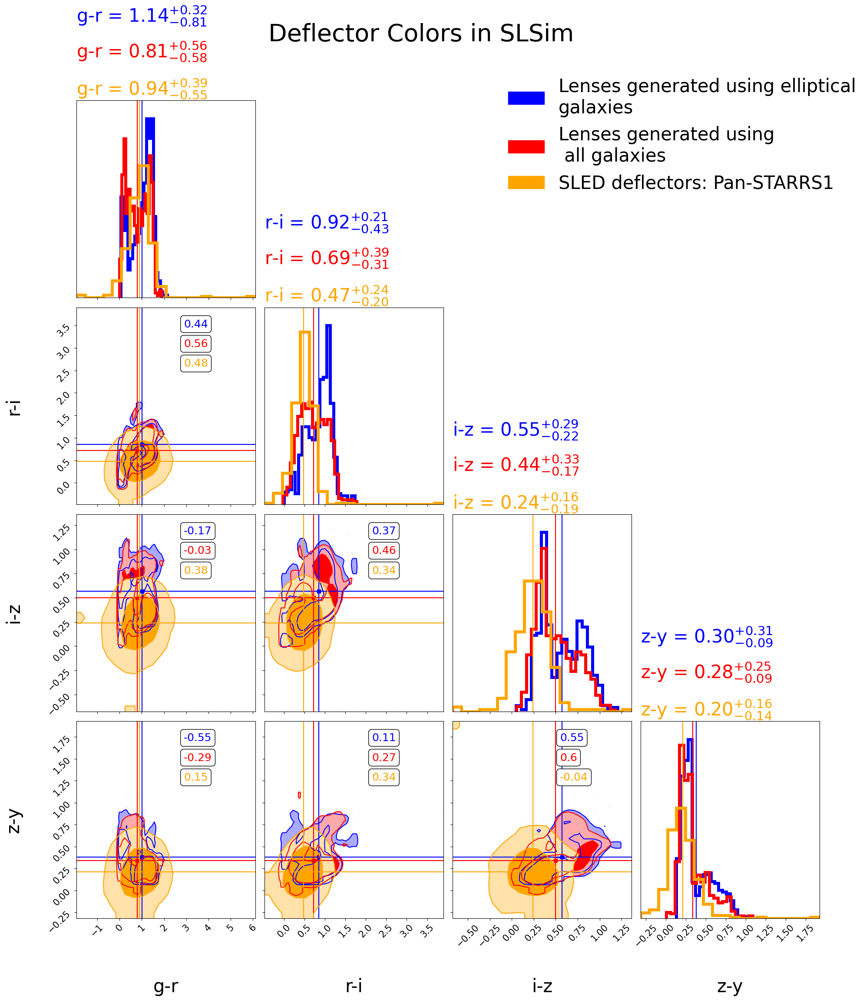

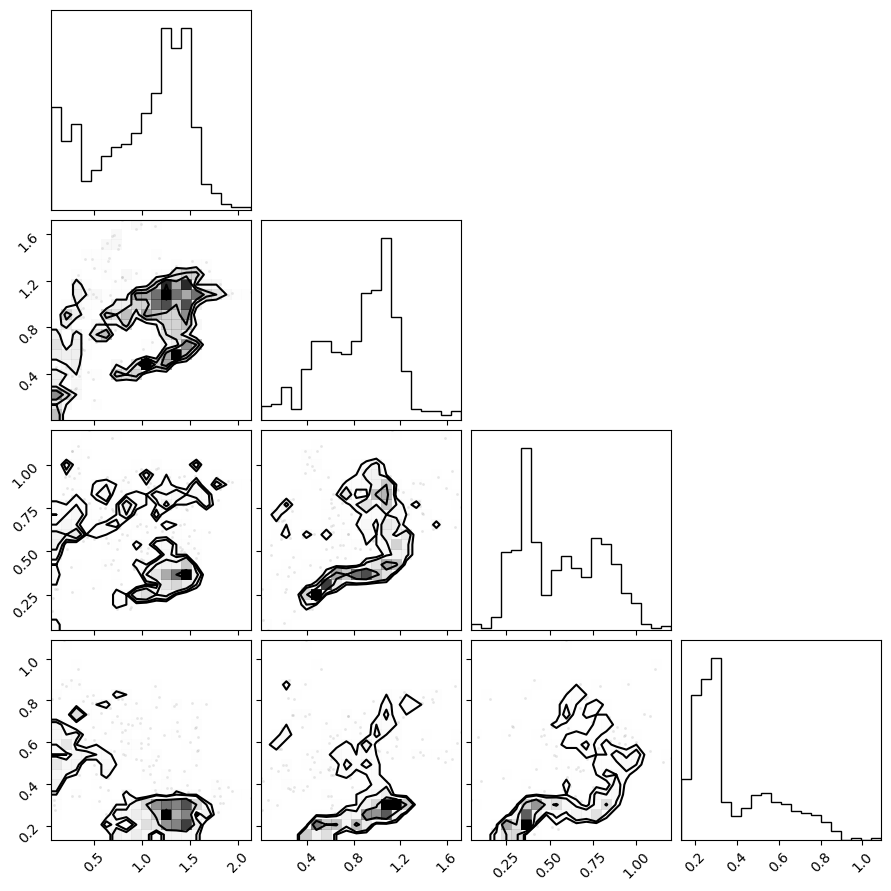

<Figure size 640x480 with 0 Axes>

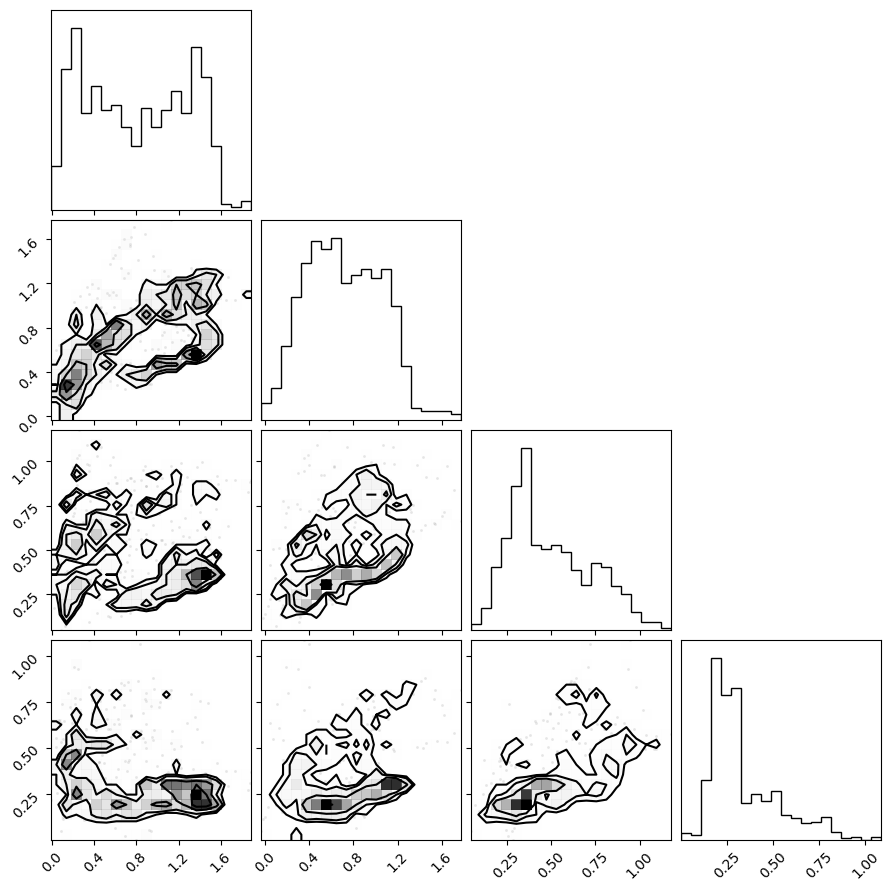

<Figure size 640x480 with 0 Axes>

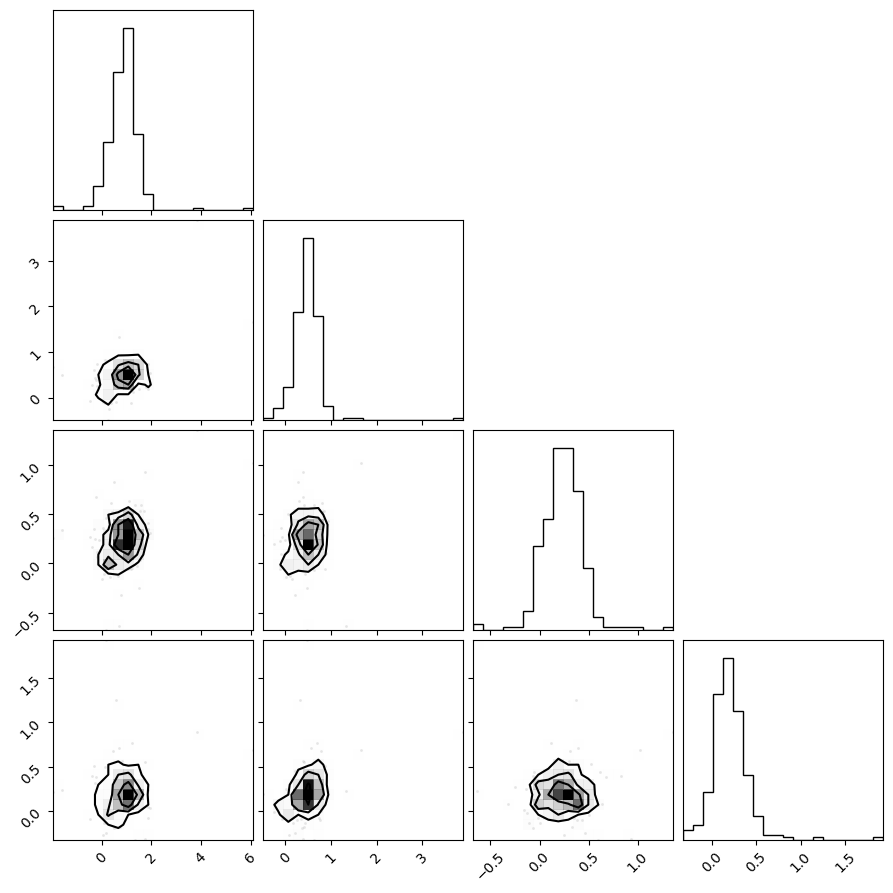

<Figure size 640x480 with 0 Axes>

In [129]:
wanted = full_pop_df[[f"deflector_light_{b}_magnitude" for b in bands[1:]]]
# Calculate the colors for deflectors
deflector_colors = pd.DataFrame(
    {
        "g-r": full_pop_df["deflector_light_g_magnitude"]
        - full_pop_df["deflector_light_r_magnitude"],
        "r-i": full_pop_df["deflector_light_r_magnitude"]
        - full_pop_df["deflector_light_i_magnitude"],
        "i-z": full_pop_df["deflector_light_i_magnitude"]
        - full_pop_df["deflector_light_z_magnitude"],
        "z-y": full_pop_df["deflector_light_z_magnitude"]
        - full_pop_df["deflector_light_y_magnitude"],
    }
)

deflector_colors_all = pd.DataFrame(
    {
        "g-r": full_pop_df_all["deflector_light_g_magnitude"]
        - full_pop_df_all["deflector_light_r_magnitude"],
        "r-i": full_pop_df_all["deflector_light_r_magnitude"]
        - full_pop_df_all["deflector_light_i_magnitude"],
        "i-z": full_pop_df_all["deflector_light_i_magnitude"]
        - full_pop_df_all["deflector_light_z_magnitude"],
        "z-y": full_pop_df_all["deflector_light_z_magnitude"]
        - full_pop_df_all["deflector_light_y_magnitude"],
    }
)

# Calculate the colors for deflectors in sled_df using Pan-STARRS1 magnitudes
sled_deflector_colors = pd.DataFrame(
    {
        "g-r": sled_df["Pan-STARRS1_mag_g"] - sled_df["Pan-STARRS1_mag_r"],
        "r-i": sled_df["Pan-STARRS1_mag_r"] - sled_df["Pan-STARRS1_mag_i"],
        "i-z": sled_df["Pan-STARRS1_mag_i"] - sled_df["Pan-STARRS1_mag_z"],
        "z-Y": sled_df["Pan-STARRS1_mag_z"] - sled_df["Pan-STARRS1_mag_Y"],
    }
).dropna()
# Generate the corner plot
fig = make_contour(
    [deflector_colors, deflector_colors_all, sled_deflector_colors],
    labels=["g-r", "r-i", "i-z", "z-y"],
    colors=["b", "r", "orange"],
    categories=[
        "Lenses generated using elliptical \ngalaxies",
        "Lenses generated using\n all galaxies",
        "SLED deflectors: Pan-STARRS1",
    ],
    show_correlation=True,
    show_every_title=True,
)
fig.suptitle("Deflector Colors in SLSim", y=1.04, size=40)

### Add some useful columns for parameter comparison

In [155]:
quasar_lens_population_all_deflector

In [ ]:
# Apply the function element-wise to handle pandas Series
full_pop_df["deflector_mass_phi"], full_pop_df["deflector_mass_q"] = zip(
    *full_pop_df.apply(
        lambda row: ellipticity2phi_q(
            row["deflector_mass_e1"], row["deflector_mass_e2"]
        ),
        axis=1,
    )
)

full_pop_df2["deflector_mass_phi"], full_pop_df2["deflector_mass_q"] = zip(
    *full_pop_df2.apply(
        lambda row: ellipticity2phi_q(
            row["deflector_mass_e1"], row["deflector_mass_e2"]
        ),
        axis=1,
    )
)

full_pop_df_all["deflector_mass_phi"], full_pop_df_all["deflector_mass_q"] = zip(
    *full_pop_df_all.apply(
        lambda row: ellipticity2phi_q(
            row["deflector_mass_e1"], row["deflector_mass_e2"]
        ),
        axis=1,
    )
)

extended_i_band_mags = [
    quasar_lens_population[i].source_light_model_lenstronomy("i")[1]["kwargs_source"][
        0
    ]["magnitude"]
    for i in range(len(quasar_lens_population))
]

full_pop_df["extended_source_i_mag"] = extended_i_band_mags

# Define the 'i3' column
full_pop_df["i3"] = full_pop_df.apply(
    lambda row: (
        row["point_source_light_i_magnitude_2"]
        if not (
            np.isnan(row["point_source_light_i_magnitude_2"])
            or row["point_source_light_i_magnitude_2"] == 0
        )
        else row["point_source_light_i_magnitude_1"]
    ),
    axis=1,
)

full_pop_df["g3"] = full_pop_df.apply(
    lambda row: (
        row["point_source_light_g_magnitude_2"]
        if not (
            np.isnan(row["point_source_light_g_magnitude_2"])
            or row["point_source_light_g_magnitude_2"] == 0
        )
        else row["point_source_light_g_magnitude_1"]
    ),
    axis=1,
)

full_pop_df2["i3"] = full_pop_df2.apply(
    lambda row: (
        row["point_source_light_i_magnitude_2"]
        if not (
            np.isnan(row["point_source_light_i_magnitude_2"])
            or row["point_source_light_i_magnitude_2"] == 0
        )
        else row["point_source_light_i_magnitude_1"]
    ),
    axis=1,
)

full_pop_df_all["i3"] = full_pop_df_all.apply(
    lambda row: (
        row["point_source_light_i_magnitude_2"]
        if not (
            np.isnan(row["point_source_light_i_magnitude_2"])
            or row["point_source_light_i_magnitude_2"] == 0
        )
        else row["point_source_light_i_magnitude_1"]
    ),
    axis=1,
)

extended_i_band_mags2 = [
    quasar_lens_population2[i].source_light_model_lenstronomy("i")[1]["kwargs_source"][
        0
    ]["magnitude"]
    for i in range(len(quasar_lens_population2))
]
full_pop_df2["extended_source_i_mag"] = extended_i_band_mags2

extended_i_band_mags3 = [
    quasar_lens_population_all_deflector[i].source_light_model_lenstronomy("i")[1][
        "kwargs_source"
    ][0]["magnitude"]
    for i in range(len(quasar_lens_population_all_deflector))
]
full_pop_df_all["extended_source_i_mag"] = extended_i_band_mags3

/var/folders/97/kgg891cd1tg6h957n9nm8rkm0000gn/T/ipykernel_32927/429319645.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  full_pop_df_all['deflector_mass_phi'], full_pop_df_all['deflector_mass_q'] = zip(*full_pop_df_all.apply(
/var/folders/97/kgg891cd1tg6h957n9nm8rkm0000gn/T/ipykernel_32927/429319645.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  full_pop_df_all['deflector_mass_phi'], full_pop_df_all['deflector_mass_q'] = zip(*full_pop_df_all.apply(
/var/folders/97/kgg891cd1tg6h957n9nm8rkm0000gn/T/ipykernel_32927/429

/Users/padmavenkatraman/Documents/StrongLensing/slsim_env/lib/python3.11/site-packages/corner/core.py:846: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if xs[k1] is not None:
/Users/padmavenkatraman/Documents/StrongLensing/slsim_env/lib/python3.11/site-packages/corner/core.py:847: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  axes[k1, k1].axvline(xs[k1], **kwargs)
/Users/padmavenkatraman/Documents/StrongLensing/slsim_env/lib/python3.11/site-packages/corner/core.py:849: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consi

Text(0.5, 0.98, 'Comparison of Lens and Source Properties')

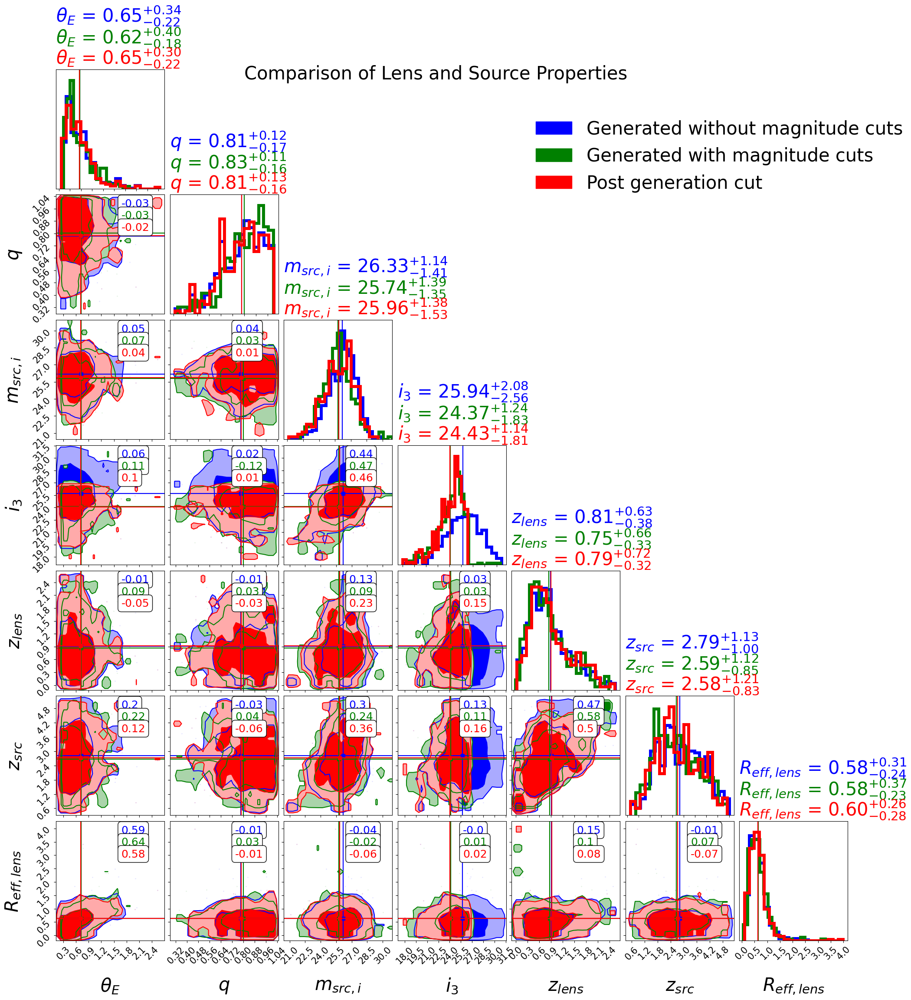

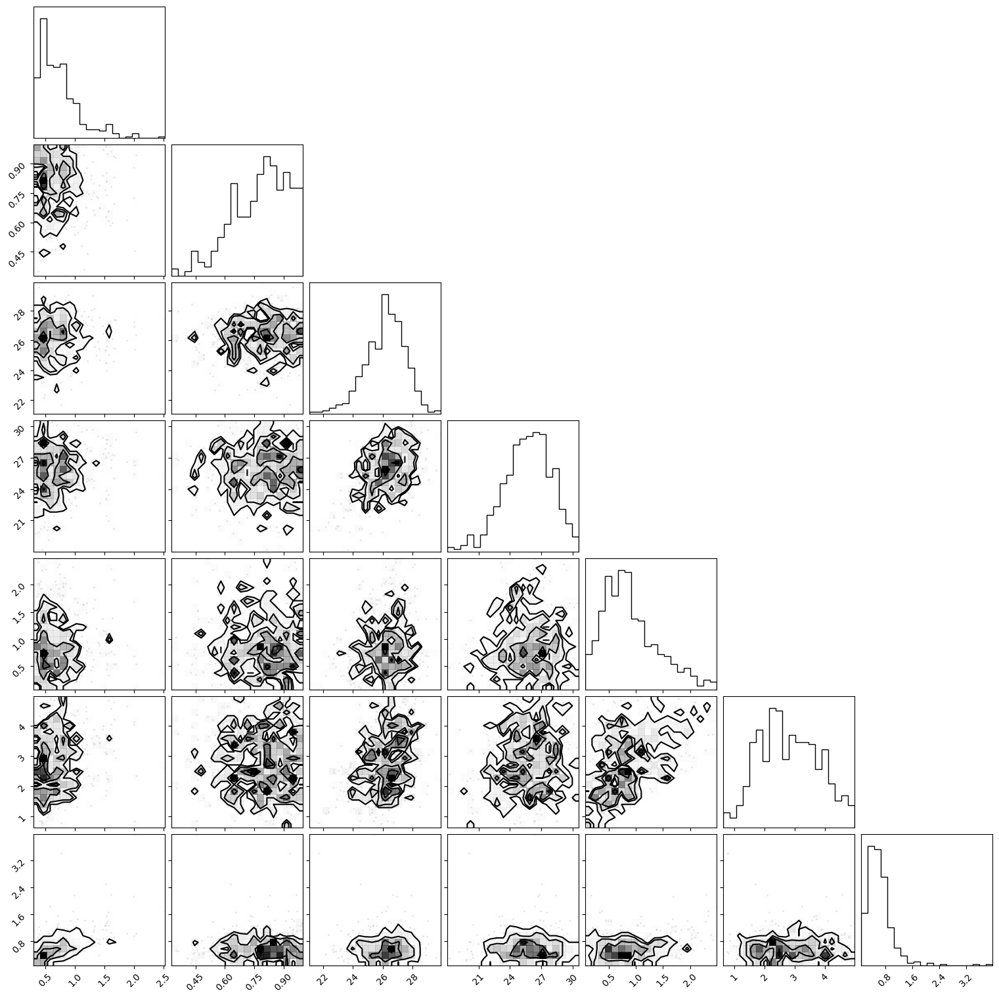

<Figure size 640x480 with 0 Axes>

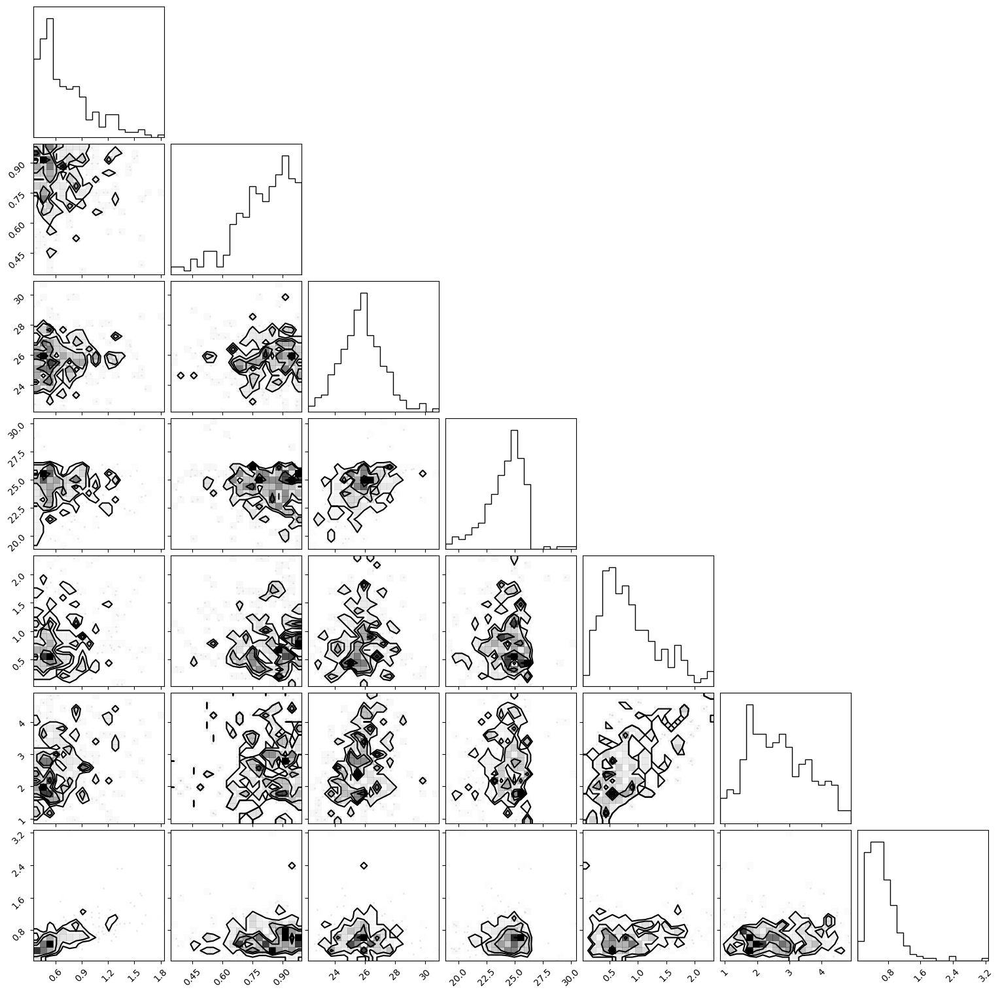

<Figure size 640x480 with 0 Axes>

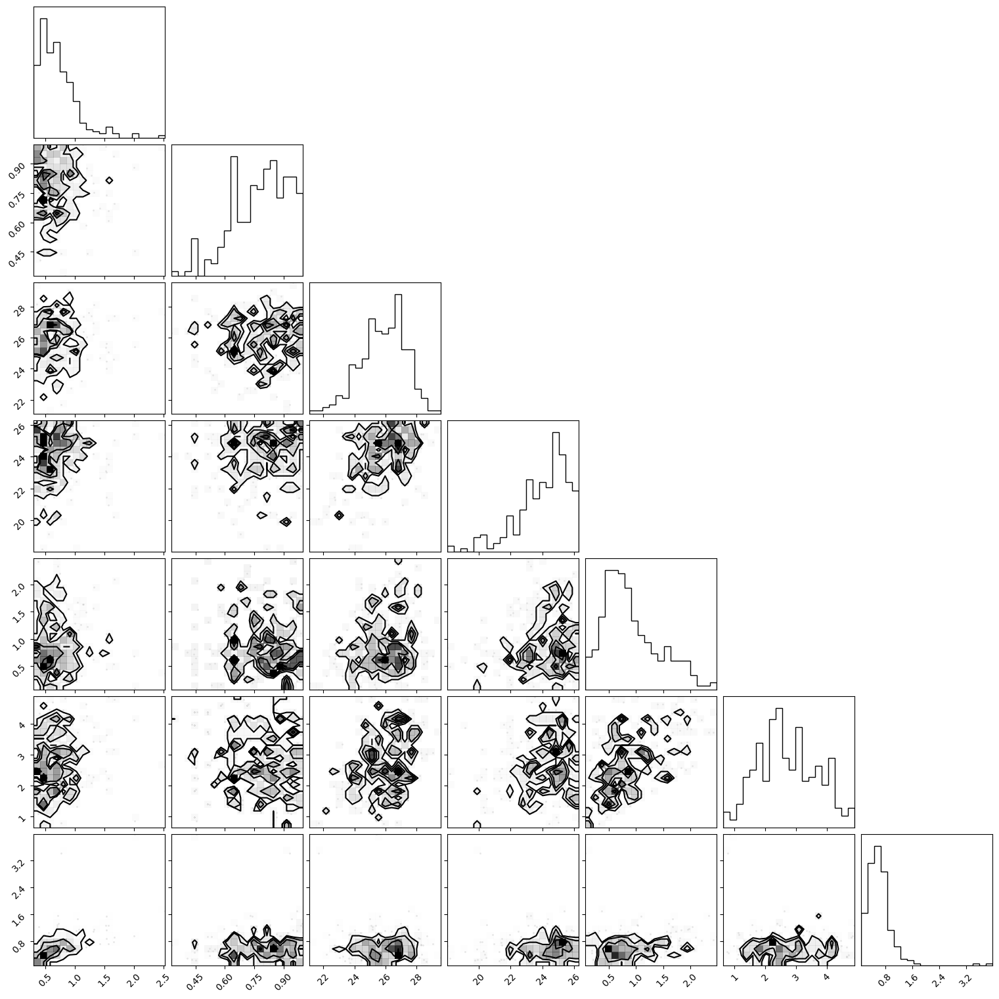

<Figure size 640x480 with 0 Axes>

In [84]:
1  # Define the columns to compare
columns_to_compare = [
    "deflector_mass_theta_E",  # Einstein radius
    "deflector_mass_q",  # Ellipticity
    "extended_source_i_mag",  # Extended source magnitude
    "i3",  # 2nd/3rd i-band point source lensed magnitude
    "deflector_redshift",  # Lens redshift
    "point_source_redshift",  # Source redshift
    "deflector_light_i_R_sersic",  # Lens effective radius
]

# Extract the relevant columns from both dataframes
data_full_pop_df = full_pop_df[columns_to_compare].dropna()
data_full_pop_df2 = full_pop_df2[columns_to_compare].dropna()
data_post_trunc = full_pop_df[full_pop_df["g3"] < 25][columns_to_compare].dropna()

# Create the contour plot
fig = make_contour(
    list_of_dists=[data_full_pop_df, data_full_pop_df2, data_post_trunc],
    labels=[
        r"$\theta_E$",
        r"$q$",
        r"$m_{src,i}$",
        r"$i_{3}$",
        r"$z_{lens}$",
        r"$z_{src}$",
        r"$R_{eff,lens}$",
    ],
    categories=[
        "Generated without magnitude cuts",
        "Generated with magnitude cuts",
        "Post generation cut",
    ],
    colors=["blue", "green", "red"],
    show_correlation=True,
    show_every_title=True,
)

fig.suptitle("Comparison of Lens and Source Properties", size=30)

### Compare deflector color against redhsift, ellipticity, gamma_pl

In [ ]:
full_pop_df["def"]

Index(['ID', 'deflector_mass_theta_E', 'deflector_mass_gamma',
       'deflector_mass_center_x', 'deflector_mass_center_y',
       'deflector_mass_e1', 'deflector_mass_e2', 'deflector_mass_gamma1',
       'deflector_mass_gamma2', 'deflector_mass_ra_0',
       ...
       'micro_shear_3', 'micro_shear_angle_2', 'micro_shear_angle_3',
       'point_source_arrival_time_2', 'point_source_arrival_time_3',
       'deflector_mass_phi', 'deflector_mass_q', 'i3', 'extended_source_i_mag',
       'g3'],
      dtype='object', length=150)

In [154]:
full_pop_df["deflector_light_phi"], full_pop_df["deflector_light_q"] = zip(
    *full_pop_df.apply(
        lambda row: ellipticity2phi_q(
            row["deflector_light_i_e1"], row["deflector_light_i_e2"]
        ),
        axis=1,
    )
)

full_pop_df2["deflector_light_phi"], full_pop_df2["deflector_light_q"] = zip(
    *full_pop_df2.apply(
        lambda row: ellipticity2phi_q(
            row["deflector_light_i_e1"], row["deflector_light_i_e2"]
        ),
        axis=1,
    )
)

full_pop_df_all["deflector_light_phi"], full_pop_df_all["deflector_light_q"] = zip(
    *full_pop_df_all.apply(
        lambda row: ellipticity2phi_q(
            row["deflector_light_i_e1"], row["deflector_light_i_e2"]
        ),
        axis=1,
    )
)

/var/folders/97/kgg891cd1tg6h957n9nm8rkm0000gn/T/ipykernel_32927/2211331471.py:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  full_pop_df_all['deflector_light_phi'], full_pop_df_all['deflector_light_q'] = zip(*full_pop_df_all.apply(
/var/folders/97/kgg891cd1tg6h957n9nm8rkm0000gn/T/ipykernel_32927/2211331471.py:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  full_pop_df_all['deflector_light_phi'], full_pop_df_all['deflector_light_q'] = zip(*full_pop_df_all.apply(


In [153]:
full_pop_df_all.columns

Index(['ID', 'deflector_mass_theta_E', 'deflector_mass_gamma',
       'deflector_mass_center_x', 'deflector_mass_center_y',
       'deflector_mass_e1', 'deflector_mass_e2', 'deflector_mass_gamma1',
       'deflector_mass_gamma2', 'deflector_mass_ra_0',
       ...
       'point_source_light_z_magnitude_4', 'point_source_light_y_ra_image_4',
       'point_source_light_y_dec_image_4', 'point_source_light_y_magnitude_4',
       'image_4_arrival_time', 'micro_kappa_star_4', 'micro_kappa_tot_4',
       'micro_shear_4', 'micro_shear_angle_4', 'point_source_arrival_time_4'],
      dtype='object', length=166)

/Users/padmavenkatraman/Documents/StrongLensing/slsim_env/lib/python3.11/site-packages/corner/core.py:846: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if xs[k1] is not None:
/Users/padmavenkatraman/Documents/StrongLensing/slsim_env/lib/python3.11/site-packages/corner/core.py:847: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  axes[k1, k1].axvline(xs[k1], **kwargs)
/Users/padmavenkatraman/Documents/StrongLensing/slsim_env/lib/python3.11/site-packages/corner/core.py:849: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consi

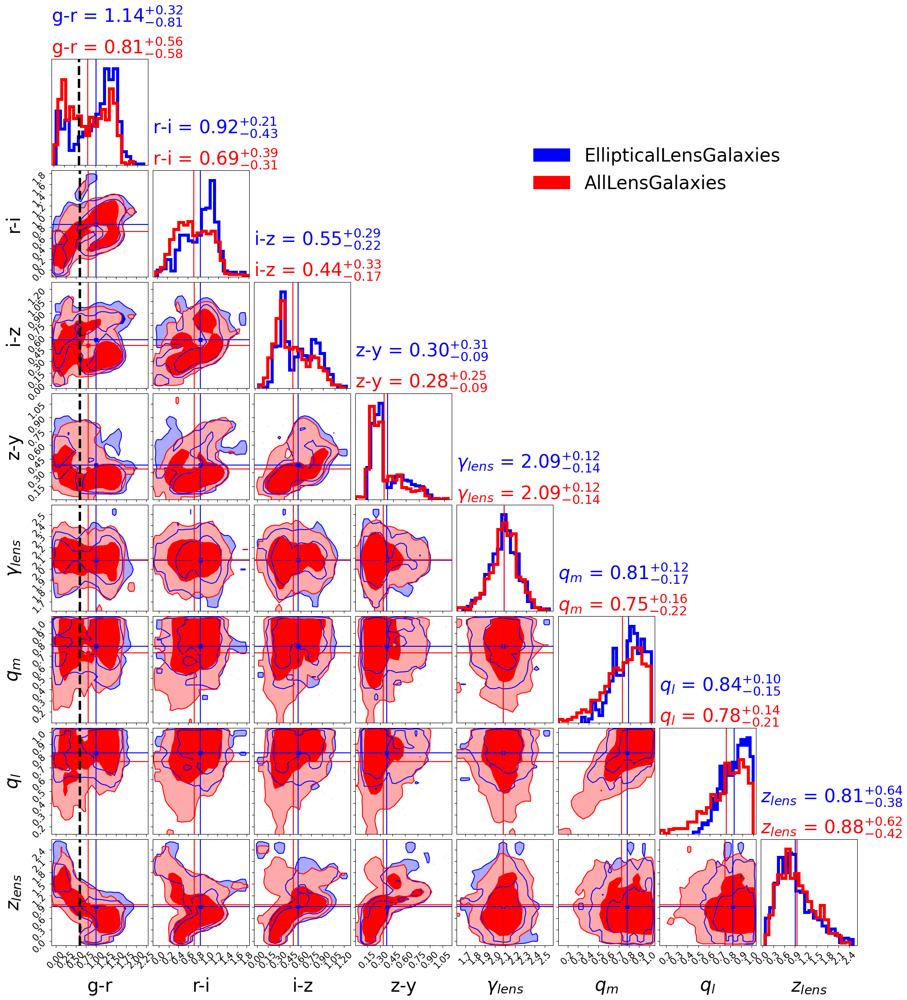

In [163]:
# Calculate the colors for deflectors
deflector_colors = pd.DataFrame(
    {
        "g-r": full_pop_df["deflector_light_g_magnitude"]
        - full_pop_df["deflector_light_r_magnitude"],
        "r-i": full_pop_df["deflector_light_r_magnitude"]
        - full_pop_df["deflector_light_i_magnitude"],
        "i-z": full_pop_df["deflector_light_i_magnitude"]
        - full_pop_df["deflector_light_z_magnitude"],
        "z-y": full_pop_df["deflector_light_z_magnitude"]
        - full_pop_df["deflector_light_y_magnitude"],
    }
)

deflector_colors_all = pd.DataFrame(
    {
        "g-r": full_pop_df_all["deflector_light_g_magnitude"]
        - full_pop_df_all["deflector_light_r_magnitude"],
        "r-i": full_pop_df_all["deflector_light_r_magnitude"]
        - full_pop_df_all["deflector_light_i_magnitude"],
        "i-z": full_pop_df_all["deflector_light_i_magnitude"]
        - full_pop_df_all["deflector_light_z_magnitude"],
        "z-y": full_pop_df_all["deflector_light_z_magnitude"]
        - full_pop_df_all["deflector_light_y_magnitude"],
    }
)

deflector_colors["gamma_pl"] = full_pop_df["deflector_mass_gamma"]
deflector_colors["mass_q"] = full_pop_df["deflector_mass_q"]
deflector_colors["light_q"] = full_pop_df["deflector_light_q"]
deflector_colors["redshift"] = full_pop_df["deflector_redshift"]

deflector_colors_all["gamma_pl"] = full_pop_df_all["deflector_mass_gamma"]
deflector_colors_all["mass_q"] = full_pop_df_all["deflector_mass_q"]
deflector_colors_all["light_q"] = full_pop_df_all["deflector_light_q"]
deflector_colors_all["redshift"] = full_pop_df_all["deflector_redshift"]
fig = make_contour(
    [deflector_colors, deflector_colors_all],
    labels=[
        "g-r",
        "r-i",
        "i-z",
        "z-y",
        "$\gamma_{lens}$",
        "$q_{m}$",
        "$q_l$",
        "$z_{lens}$",
    ],
    categories=["EllipticalLensGalaxies", "AllLensGalaxies"],
    colors=["blue", "red"],
    show_every_title=True,
)
for ax in fig.axes[:: len(deflector_colors.columns)]:
    ax.axvline(x=0.6, color="black", linestyle="--", linewidth=4)

In [86]:
# path_to_stored_catalog = "dec1_imsep07_withlensobj.pkl"
# full_pop_df.to_pickle(path_to_stored_catalog)

### Analyze the colors of quasars

In [130]:
### read in SDSS quasars
sdss_quasars = pd.read_csv("../../../sdss_quasars.csv", delimiter=",", header=None)
sdss_quasars = sdss_quasars.rename(
    columns={
        2: "redshift",
        10: "u_mag",
        11: "e_u_mag",
        12: "g_mag",
        13: "e_g_mag",
        14: "r_mag",
        15: "e_r_mag",
        16: "i_mag",
        17: "e_i_mag",
        18: "z_mag",
        19: "e_z_mag",
    }
)
sdss_quasars.drop(labels=[0, 1], axis=1, inplace=True)

In [131]:
sdss_quasars

,redshift,3,4,5,6,7,8,9,u_mag,e_u_mag,...,e_g_mag,r_mag,e_r_mag,i_mag,e_i_mag,z_mag,e_z_mag,20,21,22
0,0.479,0,0,11.96,0,2,25.3,0.11,17.83,0.011,...,0.010,17.70,0.010,17.65,0.010,17.66,0.024,0.03,1,2
1,0.954,0,0,42.91,0,55,39.7,0.25,18.34,0.016,...,0.010,17.93,0.010,17.88,0.010,17.69,0.023,0.03,1,2
2,1.890,0,0,58.24,0,46,46.3,0.39,18.55,0.018,...,0.010,18.71,0.011,18.40,0.010,18.32,0.036,0.04,1,2
3,0.780,0,1,16.53,0,2,5.4,1.67,18.94,0.025,...,0.010,18.94,0.012,19.04,0.017,19.18,0.087,0.03,1,
4,2.120,0,1,46.95,0,14,28.9,2.03,20.92,0.087,...,0.029,20.66,0.038,20.53,0.057,20.14,0.189,0.03,1,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
893,0.558,23,55,45.51,0,49,23.2,1.17,18.24,0.012,...,0.010,18.09,0.010,17.98,0.010,17.91,0.025,0.03,1,
894,1.004,23,56,49.92,1,5,31.5,0.14,18.29,0.014,...,0.010,17.99,0.010,18.01,0.010,17.86,0.025,0.02,1,2
895,4.340,23,57,18.36,0,43,50.4,0.19,24.00,0.782,...,0.144,20.07,0.026,19.83,0.036,19.61,0.105,0.04,2,
896,1.119,23,59,17.03,-1,10,29.1,0.39,18.60,0.018,...,0.010,18.14,0.010,18.08,0.010,18.01,0.028,0.05,1,


### Read in AGILE catalog

In [ ]:
# load in agile quasars
path_to_agile_catalog = "agile_catalog_unobscured_agn.fits"
agile_catalog = Table.read(path_to_agile_catalog)

# choose unobscured quasars
# agile_catalog = agile_catalog[
#     (agile_catalog['is_agn'] == 1) & (agile_catalog['is_optical_type2'] == 0)
#     ]

# choose quasars
agile_catalog = agile_catalog[(agile_catalog["is_agn"] == 1)]

agile_catalog

ID,RA,DEC,Z,M,SFR,is_agn_ctn,is_agn_ctk,is_agn,is_optical_type2,DISK_RADIUS,BULGE_RADIUS,DISK_RATIO,DISK_ANGLE,BULGE_RATIO,BULGE_ANGLE,MBH,log_L_bol,log_lambda_Edd,lsst-u_total,lsst-u_disk,lsst-u_bulge,lsst-u_point,magabs_lsst-u_point,lsst-g_total,lsst-g_disk,lsst-g_bulge,lsst-g_point,magabs_lsst-g_point,lsst-r_total,lsst-r_disk,lsst-r_bulge,lsst-r_point,magabs_lsst-r_point,lsst-i_total,lsst-i_disk,lsst-i_bulge,lsst-i_point,magabs_lsst-i_point,lsst-z_total,lsst-z_disk,lsst-z_bulge,lsst-z_point,magabs_lsst-z_point,lsst-y_total,lsst-y_disk,lsst-y_bulge,lsst-y_point,magabs_lsst-y_point
int64,float64,float64,float64,float64,float64,int64,int64,int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
669,149.77913078298394,4.588169416887185,1.0538777112960815,10.622429847717285,5.679090976715088,1,0,1,0,0.30594924092292786,0.17215263843536377,0.5439417958259583,-75.16017150878906,0.30675506591796875,-75.16017150878906,7.3377487740959335,45.9335514819009,0.4954321626874023,27.10140821474662,0.6583508849143982,0.01153009943664074,26.43152723039558,-23.726187644958756,34.01731327747803,0.8955351710319519,0.024406446143984795,33.097371660302095,-23.86571505552565,47.12243259479132,1.2334064245224,0.0993543341755867,45.78967183609333,-24.227622652885717,48.49739670089298,1.8351103067398071,0.2808324098587036,46.38145398429447,-23.984892412428913,51.660474469307324,2.9881632328033447,0.7075280547142029,47.96478318178978,-23.98375864620279,60.51153897089612,3.7269136905670166,1.1019738912582397,55.68265138907086,-24.115718035788625
935,149.41127816270898,1.1298218476350887,2.371891975402832,10.762886047363281,92.3348617553711,1,0,1,0,0.5741918087005615,0.20241805911064148,0.7736381888389587,-78.25929260253906,0.7996389269828796,-78.25929260253906,6.980110808423868,44.57591841515982,-0.5045629383816124,0.09191155460660053,0.00698503665626049,7.932524749776348e-05,0.08484719270284227,-20.308787128508783,0.2379438357661025,0.055222850292921066,0.00011812220327556133,0.18260286326990588,-20.45578313714314,0.3468232704545132,0.12293946743011475,0.0005725963274016976,0.22331120669699678,-20.85164354709516,0.4558029099828828,0.1819591373205185,0.0034018075093626976,0.2704419651530016,-20.568635719887972,0.6055335255191308,0.2468065768480301,0.008041789755225182,0.35068515891587554,-20.55311362419225,0.8033369166839629,0.337641179561615,0.023067189380526543,0.44262854774182137,-20.68599770928131
1598,149.3598117925901,2.309396695405802,0.8843787908554077,8.576791763305664,0.8941977024078369,1,0,1,0,0.1143917366862297,0.021279077976942062,0.5192568898200989,35.58650588989258,0.687299907207489,35.58650588989258,4.440523067121883,41.613713431395745,-0.9271801808437017,0.27413061329446303,0.2710879147052765,0.00014216153067536652,0.002900537058511198,-13.289379736907762,0.29106580700872225,0.2869323194026947,0.0002042652922682464,0.003929222313759324,-13.299737722396344,0.3246868688044456,0.3197045922279358,0.0005479180254042149,0.00443435855110556,-13.680482364521582,0.5335056085503113,0.5278761386871338,0.001505007385276258,0.004124462477901246,-13.286121606892024,0.5966481430387879,0.5893703699111938,0.0027718644123524427,0.004505908715241574,-13.222671587138386,0.6758034218431754,0.6674693822860718,0.003595835529267788,0.004738204027835828,-13.350995273720068
1980,149.9645023565261,1.5356801933088104,2.5721309185028076,10.595592498779297,109.9815673828125,1,0,1,0,0.46181315183639526,0.29969537258148193,0.3732644021511078,-43.01392364501953,0.3363291025161743,-43.01392364501953,7.217427801967883,45.63347294838,0.3156746012945568,1.644045582876367,0.30134740471839905,0.024467376992106438,1.3182308011658614,-23.10603958115812,3.9979313989234817,1.3841577768325806,0.047408588230609894,2.5

In [166]:
data = [
    23.9
    - 2.5
    * np.log10(agile_catalog["lsst-u_point"]),  # lsst point source flux in microJanskys
    23.9 - 2.5 * np.log10(agile_catalog["lsst-g_point"]),
    23.9 - 2.5 * np.log10(agile_catalog["lsst-r_point"]),
    23.9 - 2.5 * np.log10(agile_catalog["lsst-i_point"]),
    23.9 - 2.5 * np.log10(agile_catalog["lsst-z_point"]),
    23.9 - 2.5 * np.log10(agile_catalog["lsst-y_point"]),
    agile_catalog["Z"],  # redshift
    # np.random.uniform(-1, 1, size=len(agile_catalog)), # random x position in the image
    # np.random.uniform(-1, 1, size=len(agile_catalog)), # random y position in the image
    23.9
    - 2.5
    * np.log10(
        agile_catalog["lsst-u_total"]
    ),  # convert microJanskys to total mag of extended source
    23.9 - 2.5 * np.log10(agile_catalog["lsst-g_total"]),
    23.9 - 2.5 * np.log10(agile_catalog["lsst-r_total"]),
    23.9 - 2.5 * np.log10(agile_catalog["lsst-i_total"]),
    23.9 - 2.5 * np.log10(agile_catalog["lsst-z_total"]),
    23.9 - 2.5 * np.log10(agile_catalog["lsst-y_total"]),
    agile_catalog["lsst-i_disk"]
    / (
        agile_catalog["lsst-i_disk"] + agile_catalog["lsst-i_bulge"]
    ),  # calculate disk fraction of emission compared to total extended emission
    agile_catalog["lsst-i_bulge"]
    / (
        agile_catalog["lsst-i_disk"] + agile_catalog["lsst-i_bulge"]
    ),  # assuming that the i-band is representative of each band
    agile_catalog["DISK_RADIUS"],  # disk radius in arcsec
    agile_catalog["BULGE_RADIUS"],  # bulge radius in arcsec
    (1 - agile_catalog["DISK_RATIO"])
    / (1 + agile_catalog["DISK_RATIO"])
    * np.cos(2 * agile_catalog["DISK_ANGLE"] * np.pi / 180),
    (1 - agile_catalog["DISK_RATIO"])
    / (1 + agile_catalog["DISK_RATIO"])
    * np.sin(2 * agile_catalog["DISK_ANGLE"] * np.pi / 180),
    (1 - agile_catalog["BULGE_RATIO"])
    / (1 + agile_catalog["BULGE_RATIO"])
    * np.cos(2 * agile_catalog["BULGE_ANGLE"] * np.pi / 180),
    (1 - agile_catalog["BULGE_RATIO"])
    / (1 + agile_catalog["BULGE_RATIO"])
    * np.sin(2 * agile_catalog["BULGE_ANGLE"] * np.pi / 180),
    np.ones(np.shape(agile_catalog["magabs_lsst-u_point"])),
    2 * np.ones(np.shape(agile_catalog["magabs_lsst-u_point"])),
    agile_catalog["DISK_RADIUS"]
    * (u.arcsec.to(u.rad))
    * cosmo.angular_diameter_distance(agile_catalog["Z"].value)
    .to(u.kpc)
    .value,  # physical size in kpc, assuming disk radius is in arcsec
    agile_catalog["MBH"],  # black hole mass in solar masses
    agile_catalog["log_L_bol"],  # log of bolometric luminosity
    agile_catalog["log_lambda_Edd"],  # log of Eddington ratio
]

col_names = [
    "ps_mag_u",  # point source mags
    "ps_mag_g",
    "ps_mag_r",
    "ps_mag_i",
    "ps_mag_z",
    "ps_mag_y",
    "z",  # redshift
    # 'center_x', #center of object
    # 'center_y',
    "mag_u",  # extended source TOTAL mags
    "mag_g",
    "mag_r",
    "mag_i",
    "mag_z",
    "mag_y",
    "w0",  # relative weights of each sersic profile for disk / bulge
    "w1",
    "angular_size_0",  # If double sersic profile, defines R_sersic for component 0
    "angular_size_1",  # same for component 1
    "e0_1",  # ellipticity1, defined as (1-q)/(1+q) * cos(2 phi), with q = minor-to-major axis ratio
    "e0_2",  # ellipticity2, defined as (1-q)/(1+q) * sin(2 phi)
    "e1_1",
    "e1_2",
    "n_sersic_0",  # sersic index of component 0 of extended source
    "n_sersic_1",  # sersic index of component 1 of extended source
    "physical_size",  # in kpc, assuming disk radius is in arcsec
    "black_hole_mass_exponent",  # in solar masses
    "log_L_bol",  # log of bolometric luminosity
    "log_lambda_Edd",  # log of Eddington ratio
]


catalog_table = Table(
    data,
    names=col_names,
)  # make an astropy table to inject into SLSim

catalog_table = catalog_table[
    (~np.isinf(catalog_table["ps_mag_g"])) & np.isfinite(catalog_table["z"])
]

# fix units for the table
units_catalog_table = {
    "ps_mag_u": u.mag,
    "ps_mag_g": u.mag,
    "ps_mag_r": u.mag,
    "ps_mag_i": u.mag,
    "ps_mag_z": u.mag,
    "ps_mag_y": u.mag,
    "z": u.dimensionless_unscaled,
    "center_x": u.arcsec,
    "center_y": u.arcsec,
    "mag_u": u.mag,
    "mag_g": u.mag,
    "mag_r": u.mag,
    "mag_i": u.mag,
    "mag_z": u.mag,
    "mag_y": u.mag,
    "w0": u.dimensionless_unscaled,
    "w1": u.dimensionless_unscaled,
    "angular_size_0": u.arcsec,
    "angular_size_1": u.arcsec,
    "e0_1": u.dimensionless_unscaled,
    "e0_2": u.dimensionless_unscaled,
    "e1_1": u.dimensionless_unscaled,
    "e1_2": u.dimensionless_unscaled,
    "n_sersic_0": u.dimensionless_unscaled,
    "n_sersic_1": u.dimensionless_unscaled,
    "physical_size": u.kpc,
    "black_hole_mass_exponent": u.dimensionless_unscaled,
    "log_L_bol": u.dimensionless_unscaled,
    "log_lambda_Edd": u.dimensionless_unscaled,
}

for col in catalog_table.colnames:
    catalog_table[col].unit = units_catalog_table.get(col, u.dimensionless_unscaled)


catalog_table = catalog_table[catalog_table["w0"] + catalog_table["w1"] == 1]

agile_quasars = catalog_table

In [133]:
pd.set_option("display.max_columns", None)  # show all columns
pd.set_option("display.max_colwidth", None)  # don't truncate column contents
pd.set_option("display.width", None)  # don't wrap lines

In [ ]:
bands_color = list("ugriz")
for i in range(4):
    band1 = bands_color[i]
    band2 = bands_color[i + 1]
    sdss_quasars[f"{band1}-{band2}"] = (
        sdss_quasars[f"{band1}_mag"] - sdss_quasars[f"{band2}_mag"]
    )

In [45]:
sdss_quasars

,redshift,3,4,5,6,7,8,9,u_mag,e_u_mag,g_mag,e_g_mag,r_mag,e_r_mag,i_mag,e_i_mag,z_mag,e_z_mag,20,21,22,u-g,g-r,r-i,i-z
0,0.479,0,0,11.96,0,2,25.3,0.11,17.83,0.011,17.58,0.010,17.70,0.010,17.65,0.010,17.66,0.024,0.03,1,2,0.25,-0.12,0.05,-0.01
1,0.954,0,0,42.91,0,55,39.7,0.25,18.34,0.016,18.19,0.010,17.93,0.010,17.88,0.010,17.69,0.023,0.03,1,2,0.15,0.26,0.05,0.19
2,1.890,0,0,58.24,0,46,46.3,0.39,18.55,0.018,18.68,0.010,18.71,0.011,18.40,0.010,18.32,0.036,0.04,1,2,-0.13,-0.03,0.31,0.08
3,0.780,0,1,16.53,0,2,5.4,1.67,18.94,0.025,18.79,0.010,18.94,0.012,19.04,0.017,19.18,0.087,0.03,1,,0.15,-0.15,-0.10,-0.14
4,2.120,0,1,46.95,0,14,28.9,2.03,20.92,0.087,20.70,0.029,20.66,0.038,20.53,0.057,20.14,0.189,0.03,1,,0.22,0.04,0.13,0.39
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
893,0.558,23,55,45.51,0,49,23.2,1.17,18.24,0.012,17.95,0.010,18.09,0.010,17.98,0.010,17.91,0.025,0.03,1,,0.29,-0.14,0.11,0.07
894,1.004,23,56,49.92,1,5,31.5,0.14,18.29,0.014,18.08,0.010,17.99,0.010,18.01,0.010,17.86,0.025,0.02,1,2,0.21,0.09,-0.02,0.15
895,4.340,23,57,18.36,0,43,50.4,0.19,24.00,0.782,22.44,0.144,20.07,0.026,19.83,0.036,19.61,0.105,0.04,2,,1.56,2.37,0.24,0.22
896,1.119,23,59,17.03,-1,10,29.1,0.39,18.60,0.018,18.40,0.010,18.14,0.010,18.08,0.010,18.01,0.028,0.05,1,,0.20,0.26,0.06,0.07


In [ ]:
sdss_quasars["M_i"] = compute_absolute_magnitude(
    sdss_quasars["i_mag"], sdss_quasars["redshift"], cosmo
)

# Example: Compute absolute magnitude for SLSim quasars
full_pop_df["M_i"] = compute_absolute_magnitude(
    full_pop_df["ps_i_mag_true"], full_pop_df["point_source_redshift"], cosmo
)

In [49]:
filtered = full_pop_df[
    (full_pop_df["M_i"] < sdss_quasars["M_i"].max())
    & (full_pop_df["M_i"] > sdss_quasars["M_i"].min())
    & (full_pop_df["point_source_redshift"] > sdss_quasars["redshift"].min())
    & (full_pop_df["point_source_redshift"] < sdss_quasars["redshift"].max())
]

In [ ]:
# Define the bins for the 2D histogram based on the SDSS quasars
bins_M_i = np.histogram_bin_edges(sdss_quasars["M_i"], bins="auto")
bins_redshift = np.histogram_bin_edges(sdss_quasars["redshift"], bins="auto")

# Compute the 2D histogram for SDSS quasars
hist_sdss, xedges, yedges = np.histogram2d(
    sdss_quasars["M_i"], sdss_quasars["redshift"], bins=[bins_M_i, bins_redshift]
)

# Normalize the histogram to get probabilities
hist_sdss_prob = hist_sdss / hist_sdss.sum()

# Assign each row in full_pop_df to a bin
indices_M_i = np.digitize(full_pop_df["M_i"], bins_M_i) - 1
indices_redshift = np.digitize(full_pop_df["point_source_redshift"], bins_redshift) - 1

# Filter rows that fall within the valid bins
valid_rows = (
    (indices_M_i >= 0)
    & (indices_M_i < len(bins_M_i) - 1)
    & (indices_redshift >= 0)
    & (indices_redshift < len(bins_redshift) - 1)
)

# Create a mask for sampling based on the SDSS probabilities
mask = np.zeros(len(full_pop_df), dtype=bool)
for i in range(len(bins_M_i) - 1):
    for j in range(len(bins_redshift) - 1):
        # Find rows in the current bin
        bin_rows = (indices_M_i == i) & (indices_redshift == j)
        if hist_sdss[i, j] > 0:
            # Sample rows proportional to the SDSS histogram
            num_samples = int(hist_sdss_prob[i, j] * len(full_pop_df))
            try:
                sampled_indices = np.random.choice(
                    np.where(bin_rows)[0], size=num_samples, replace=False
                )
                mask[sampled_indices] = True
            except IndexError:
                continue

# Filter the rows from full_pop_df
matched_rows = full_pop_df[mask]
matched_rows

,ID,deflector_mass_theta_E,deflector_mass_gamma,deflector_mass_center_x,deflector_mass_center_y,deflector_mass_e1,deflector_mass_e2,deflector_mass_gamma1,deflector_mass_gamma2,deflector_mass_ra_0,deflector_mass_dec_0,deflector_mass_kappa,deflector_light_magnitude,deflector_light_R_sersic,deflector_light_n_sersic,deflector_light_e1,deflector_light_e2,deflector_light_center_x,deflector_light_center_y,point_source_light_ra_image_0,point_source_light_ra_image_1,point_source_light_dec_image_0,point_source_light_dec_image_1,point_source_light_magnitude_0,point_source_light_magnitude_1,velocity_dispersion,deflector_redshift,point_source_redshift,image_0_arrival_time,image_1_arrival_time,num_ps_images,micro_kappa_star_0,micro_kappa_star_1,micro_kappa_tot_0,micro_kappa_tot_1,micro_shear_0,micro_shear_1,micro_shear_angle_0,micro_shear_angle_1,point_source_arrival_time_0,point_source_arrival_time_1,external_shear,extended_unlensed_mag,extended_magnification,ps_u_mag_true,ps_g_mag_true,ps_r_mag_true,ps_i_mag_true,ps_z_mag_true,ps_y_mag_true,lens_obj,point_source_light_ra_image_2,point_source_light_ra_image_3,point_source_light_dec_image_2,point_source_light_dec_image_3,point_source_light_magnitude_2,point_source_light_magnitude_3,image_2_arrival_time,image_3_arrival_time,micro_kappa_star_2,micro_kappa_star_3,micro_kappa_tot_2,micro_kappa_tot_3,micro_shear_2,micro_shear_3,micro_shear_angle_2,micro_shear_angle_3,point_source_arrival_time_2,point_source_arrival_time_3,M_i
64,GAL-QSO-LENS_0.0314_0.0061,0.610029,1.920831,0.031407,0.006119,-0.006917,-0.005722,-0.000310,-0.015843,0.0,0.0,0.076799,19.607325,0.398139,4.0,-0.011630,-0.007097,0.031407,0.006119,-1.039289,0.260964,0.148571,-0.015076,19.220781,20.643361,169.840128,0.373434,2.209971,-23.519371,2.699716,2.0,0.080215,1.888916,0.394109,1.391711,0.267024,1.118034,2.933758,2.970598,-23.519371,2.699716,0.015846,22.341607,2.098049,19.560363,19.845679,20.213170,20.543278,20.806315,21.024871,<slsim.Lenses.lens.Lens object at 0x33da9d810>,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-25.678788
75,GAL-QSO-LENS_0.0218_0.0412,0.523524,2.094571,0.021838,0.041153,0.158249,0.170614,-0.040501,0.018525,0.0,0.0,-0.000592,21.360682,0.727796,4.0,0.076026,0.128792,0.021838,0.041153,0.170841,-0.136001,0.861217,-0.160025,19.377320,20.573959,225.494634,0.819986,1.530657,-74.250872,-0.637471,2.0,0.123288,1.183642,0.235048,1.087934,0.248978,1.258083,-0.318422,-1.336831,-74.250872,-0.637471,0.044536,22.361079,2.129655,18.468365,19.070511,19.636417,20.080729,20.414866,20.685866,<slsim.Lenses.lens.Lens object at 0x33cc670d0>,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-25.162536
155,GAL-QSO-LENS_0.0191_-0.0275,0.400455,2.074826,0.019087,-0.027535,-0.140850,-0.101278,0.042605,0.003957,0.0,0.0,0.072440,21.661062,0.539650,4.0,-0.094021,-0.092726,0.019087,-0.027535,-0.551419,0.274708,-0.187379,0.183276,19.337936,18.181914,218.011799,0.830499,1.339631,-46.172379,-14.810171,2.0,0.151702,0.466846,0.324043,0.560437,0.264990,0.571451,-2.522994,-1.701574,-46.172379,-14.810171,0.042788,24.509735,3.158239,18.694466,19.324200,19.909740,20.369506,20.717252,21.001085,<slsim.Lenses.lens.Lens object at 0x349619410>,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-24.516207
182,GAL-QSO-LENS_-0.0218_0.0237,0.501573,2.140272,-0.021769,0.023718,0.051231,0.197396,-0.002690,0.016912,0.0,0.0,-0.038875,22.538633,0.393515,4.0,0.034189,0.129053,-0.021769,0.023718,-0.148169,0.074134,-0.737044,0.210590,20.073385,21.880059,219.251308,1.020818,2.053084,-80.568819,3.554896,2.0,0.126591,1.805448,0.216452,1.264876,0.333111,1.651100,-0.252341,-0.920195,-80.568819,3.554896,0.017125,23.295192,1.813910,19.820629,20.113658,20.486331,20.819500,21.084381,21.304191,<slsim.Lenses.lens.Lens object at 0x33e9d9490>,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-25.207295
217,GAL-QSO-LENS_0.0230_0.0177,1.126248,2.085880,0.022990,0.017664,0.009024,-0.140434,-0

In [51]:
slsim_cols = [f"ps_{b}_mag_true" for b in bands_color]
slsim_cols = ["point_source_redshift", "M_i"] + slsim_cols

slsim_mags = full_pop_df[slsim_cols]

sdss_cols = ["redshift", "M_i"] + [f"{b}_mag" for b in bands_color]
sdss_mags = sdss_quasars[sdss_cols]

In [52]:
sdss_mags

,redshift,M_i,u_mag,g_mag,r_mag,i_mag,z_mag
0,0.479,-24.499566,17.83,17.58,17.70,17.65,17.66
1,0.954,-26.093866,18.34,18.19,17.93,17.88,17.69
2,1.890,-27.406678,18.55,18.68,18.71,18.40,18.32
3,0.780,-24.394992,18.94,18.79,18.94,19.04,19.18
4,2.120,-25.581915,20.92,20.70,20.66,20.53,20.14
...,...,...,...,...,...,...,...
893,0.558,-24.568154,18.24,17.95,18.09,17.98,17.91
894,1.004,-26.100954,18.29,18.08,17.99,18.01,17.86
895,4.340,-28.152333,24.00,22.44,20.07,19.83,19.61
896,1.119,-26.322240,18.60,18.40,18.14,18.08,18.01


/Users/padmavenkatraman/Documents/StrongLensing/slsim_env/lib/python3.11/site-packages/corner/core.py:846: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if xs[k1] is not None:
/Users/padmavenkatraman/Documents/StrongLensing/slsim_env/lib/python3.11/site-packages/corner/core.py:847: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  axes[k1, k1].axvline(xs[k1], **kwargs)
/Users/padmavenkatraman/Documents/StrongLensing/slsim_env/lib/python3.11/site-packages/corner/core.py:849: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consi

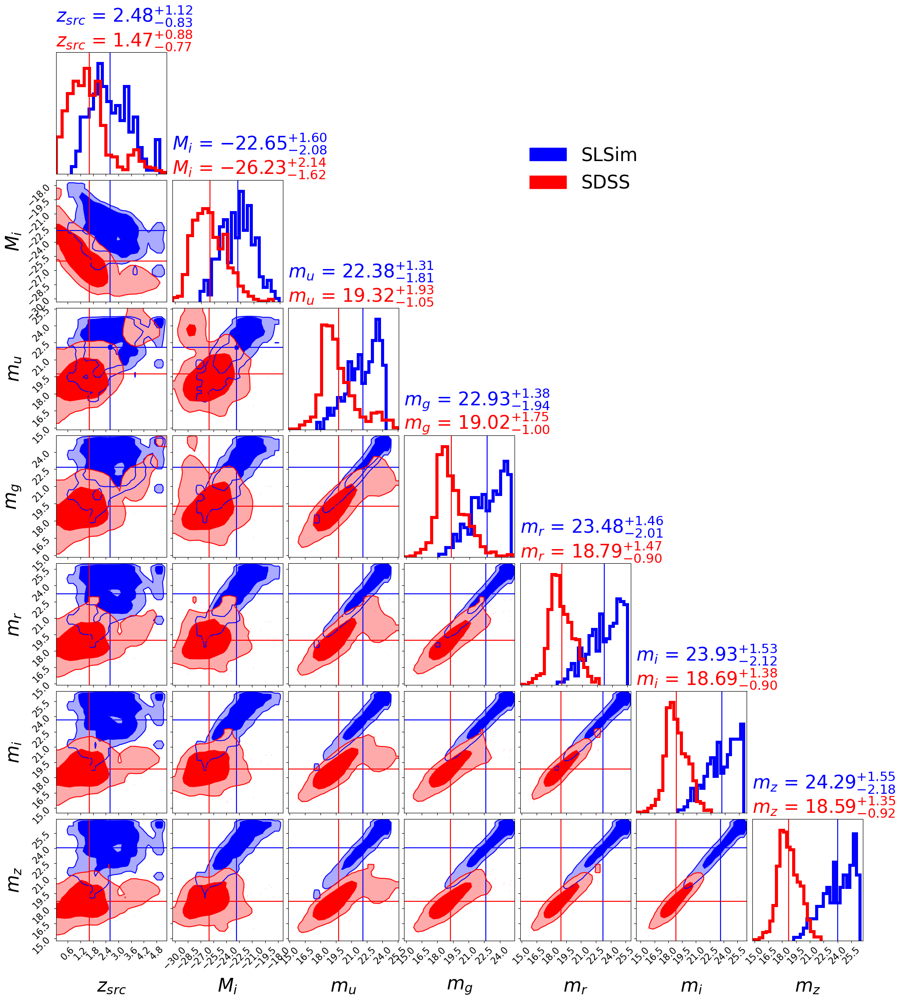

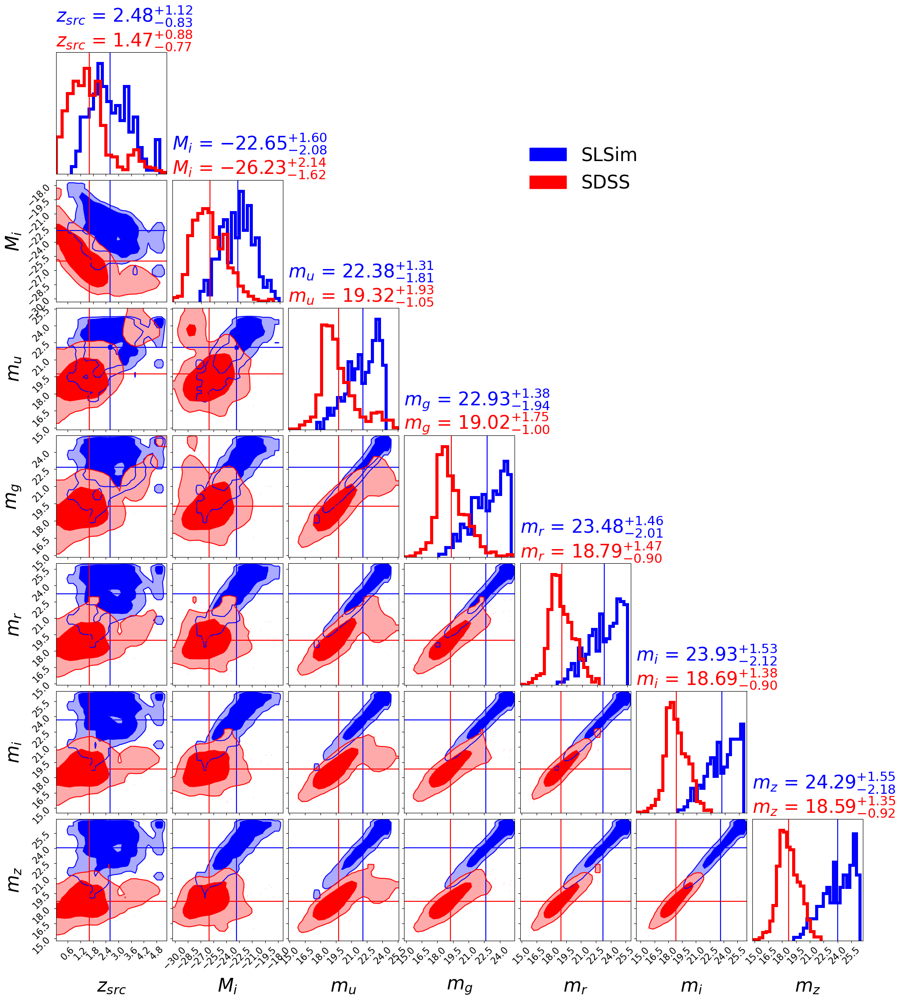

In [53]:
slsim_mags = slsim_mags.dropna()
sdss_mags = sdss_mags.dropna()
make_contour(
    list_of_dists=[slsim_mags, sdss_mags],
    labels=[
        "$z_{src}$",
        "$M_i$",
        "$m_{u}$",
        "$m_{g}$",
        "$m_{r}$",
        "$m_{i}$",
        "$m_{z}$",
    ],
    categories=["SLSim", "SDSS"],
    colors=["blue", "red"],
    show_every_title=True,
)

/Users/padmavenkatraman/Documents/StrongLensing/slsim_env/lib/python3.11/site-packages/corner/core.py:846: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if xs[k1] is not None:
/Users/padmavenkatraman/Documents/StrongLensing/slsim_env/lib/python3.11/site-packages/corner/core.py:847: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  axes[k1, k1].axvline(xs[k1], **kwargs)
/Users/padmavenkatraman/Documents/StrongLensing/slsim_env/lib/python3.11/site-packages/corner/core.py:849: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consi

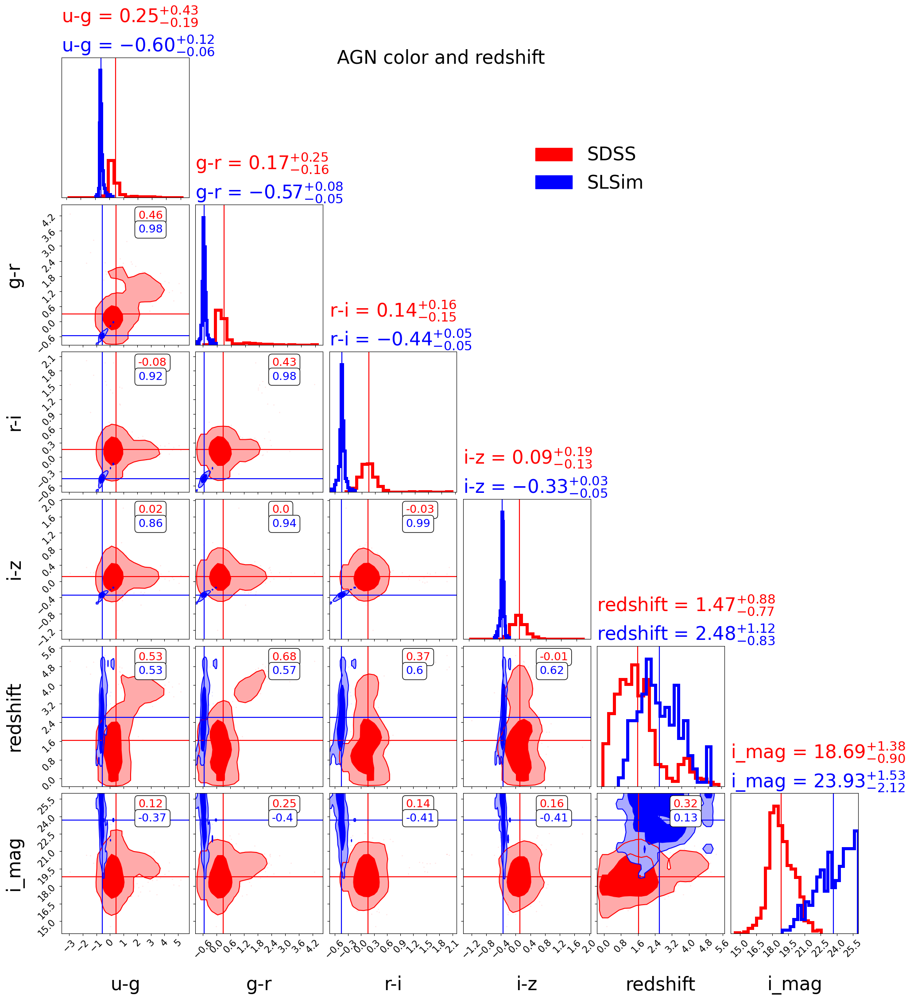

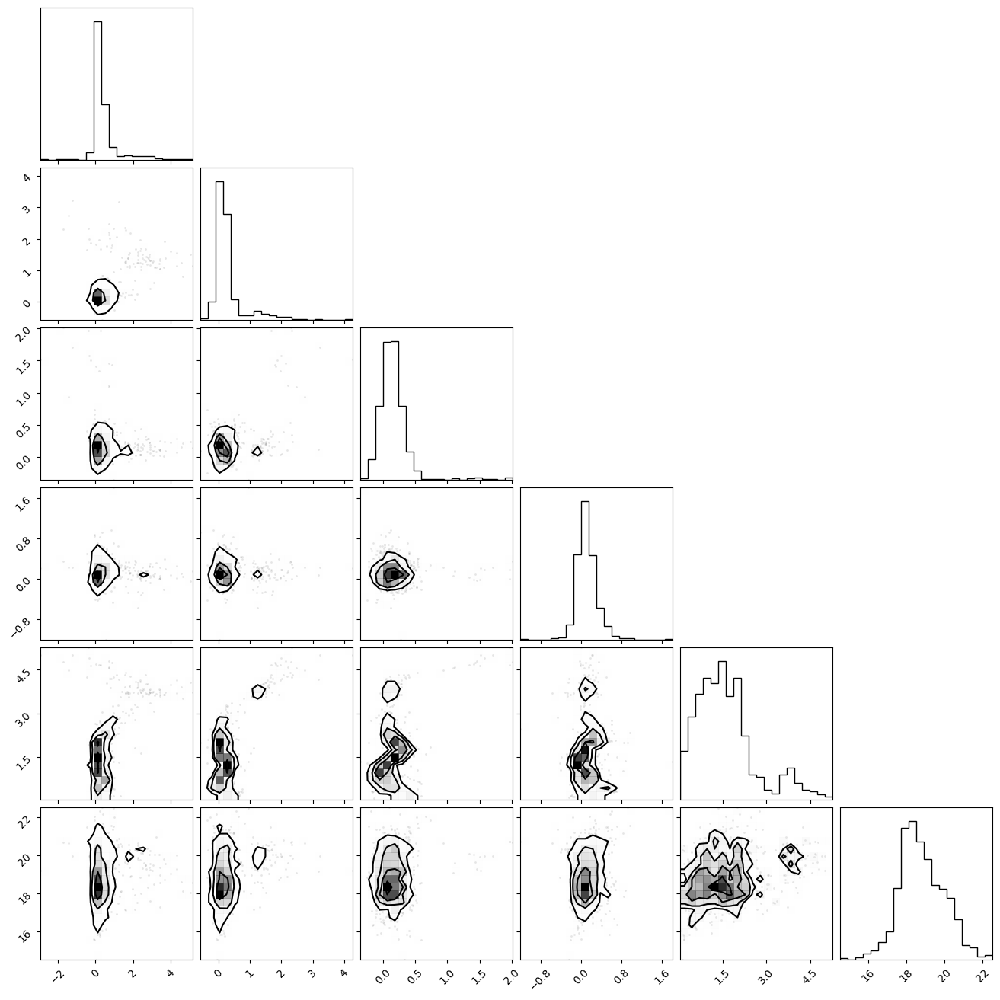

<Figure size 640x480 with 0 Axes>

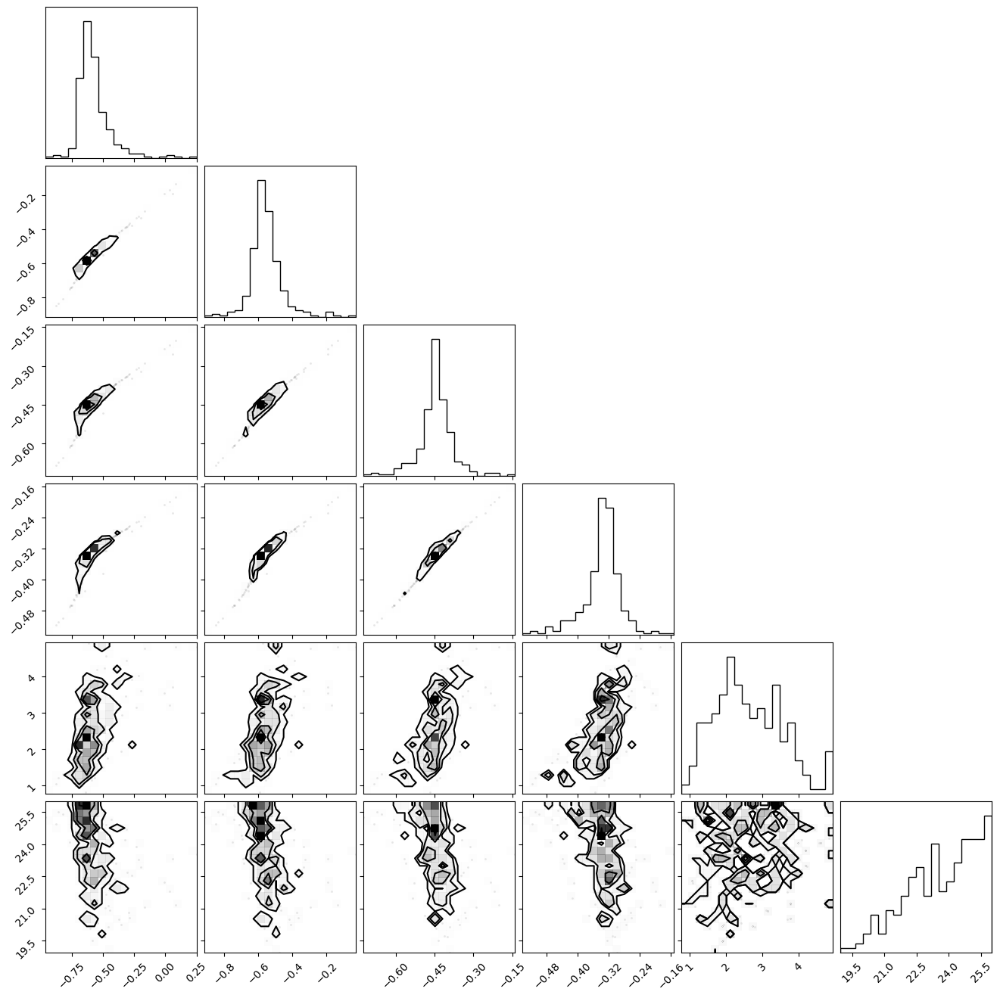

<Figure size 640x480 with 0 Axes>

In [54]:
bands = list("ugriz")
differences = {}
df_chosen = full_pop_df
for i in range(len(bands) - 1):
    band1 = bands[i]
    band2 = bands[i + 1]
    differences[f"{band1}-{band2}"] = (
        df_chosen[f"ps_{band1}_mag_true"] - df_chosen[f"ps_{band2}_mag_true"]
    )

differences = pd.DataFrame(differences)
differences["redshift"] = df_chosen["point_source_redshift"]
differences["i_mag"] = df_chosen["ps_i_mag_true"]
fig = make_contour(
    list_of_dists=[
        sdss_quasars[["u-g", "g-r", "r-i", "i-z", "redshift", "i_mag"]],
        differences,
    ],
    labels=differences.columns,
    categories=["SDSS", "SLSim"],
    colors=["red", "blue"],
    show_correlation=True,
    show_every_title=True,
)
fig.suptitle("AGN color and redshift", size=30);

## Select a lens to visualize

In [ ]:
# Select a random lens
kwargs_lens_cut = {"min_image_separation": 2, "max_image_separation": 10}
lens_class = quasar_lens_pop_ell.select_lens_at_random(**kwargs_lens_cut)

In [56]:
lens_class._source[0]._source.kwargs_point_source(
    band="g"
)  # .point_source_magnitude(band='g', lensed=False)

('SOURCE_POSITION',
 {'ra_source': np.float64(0.1317025563499305),
  'dec_source': np.float64(0.2480108466898172),
  'magnitude': np.float64(20.684413651677446)})

## Set the cadence of observation

In [ ]:
N = 10
ra_points = coord.Angle(np.random.uniform(low=0, high=360, size=N) * u.degree)
ra_points = ra_points.wrap_at(180 * u.degree)
# dec goes from -72 to +12
p = (
    np.sin(np.random.uniform(low=-72, high=12, size=N) * u.deg) - np.sin(-72 * u.deg)
) / (np.sin(12 * u.deg) - np.sin(-72 * u.deg))
dec_points = coord.Angle(
    ((((np.arcsin(2 * p - 1).to(u.deg) + 90 * u.deg) / (180 * u.deg)) * 84) - 72)
    * u.deg
)
dec_points

<Angle [-52.67123147, -28.64627156, -23.53940477, -25.58588254,
         -7.1200357 , -12.70634491, -28.97648631, -38.96309784,
          3.68107129,  -1.5933694 ] deg>

In [ ]:
ra_points[0].value, dec_points[0].value

(np.float64(126.79945095214494), np.float64(-52.671231474905966))

In [ ]:
rubin_df = get_rubin_cadence(ra_points[0].value, dec_points[0].value)

path:  /Users/padmavenkatraman/Documents/StrongLensing/rubin_sim_data/sim_baseline


In [ ]:
rubin_df

,fieldRA,visitExposureTime,observationStartMJD,fieldDec,fiveSigmaDepth,rotSkyPos
filter,,,,,,
g,"[126.59800165030539, 124.65708266712953, 129.1...","[29.2, 29.2, 29.2, 29.2, 29.2, 29.2, 29.2, 29....","[7.993156711345364, 11.109792415460106, 11.111...","[-52.25509064747738, -52.19089691084039, -52.7...","[24.283065663179613, 24.668473698853642, 24.55...","[272.160726621972, -71.49519347093148, -81.799..."
i,"[127.5944792058809, 127.6448278347301, 128.364...","[29.2, 29.2, 29.2, 29.2, 29.2, 29.2, 29.2, 29....","[0.0, 27.964754569235083, 31.106604154781962, ...","[-51.86709061446019, -53.68020627773499, -53.6...","[23.826627497011078, 23.42449913260222, 23.700...","[163.5561665089617, 262.3859450395635, -91.398..."
r,"[126.59800165030539, 124.65708266712953, 129.1...","[29.2, 29.2, 29.2, 29.2, 29.2, 29.2, 29.2, 29....","[8.017335870703391, 11.134014097093313, 11.135...","[-52.25509064747738, -52.19089691084039, -52.7...","[23.77942187398347, 24.430460364953333, 24.394...","[281.7799624623014, -71.49519347093148, -81.79..."
u,"[126.99265784163511, 128.1284262883183, 126.12...","[38.0, 38.0, 38.0, 38.0, 38.0, 38.0, 38.0, 38....","[14.071975909551838, 21.976827563907136, 43.16...","[-51.6370739141278, -52.24033205637433, -52.83...","[23.76774491726022, 23.977391075669445, 23.470...","[-71.42983597276432, 149.69697351051175, -85.1..."
y,"[128.36414868462205, 128.36414868462205, 127.4...","[29.2, 29.2, 29.2, 29.2, 29.2, 29.2, 29.2, 29....","[31.19802618520771, 31.208367827646725, 57.935...","[-53.66839157593661, -53.66839157593661, -52.6...","[22.212022036455565, 21.791940116722074, 22.11...","[-45.174341626684104, -45.174341626684104, -12..."
z,"[127.5944792058809, 127.6448278347301, 128.364...","[29.2, 29.2, 29.2, 29.2, 29.2, 29.2, 29.2, 29....","[0.024530545495508704, 27.940633689016977, 31....","[-51.86709061446019, -53.68020627773499, -53.6...","[23.176084496503226, 23.018810102190244, 23.38...","[172.20086775565122, 252.65706945484675, -91.3..."


In [ ]:
observation_dates = rubin_df["observationStartMJD"]
# in order to access r-band dates:
r_band_obsMJD = observation_dates["r"]

In [ ]:
# Get a point source coordinate so that you can plot these image center in the plot.
def compute_magnitude_zeropoint(mag_zp_1s, exposure_time=30, gain=1):
    return mag_zp_1s + 2.5 * np.log10(exposure_time / gain)


bands = list("ugrizy")
mag_zps = np.array(
    [
        26.52,
        28.51,
        28.36,
        28.17,
        27.78,
        26.82,
    ]
)  # taken from https://smtn-002.lsst.io/
mag_zero_points_1_second = dict(zip(bands, mag_zps))  # mag

mag_zero_points_30_seconds = dict(
    zip(bands, compute_magnitude_zeropoint(mag_zps))
)  # mag
delta_pix = 0.2  # arcsec/pixel
num_pix = 33  # pixels
exp_time = 30  # s
pix_coord_list = [
    point_source_coordinate_properties(
        lens_class,
        band=i,
        mag_zero_point=mag_zero_points_30_seconds[i],
        delta_pix=delta_pix,
        num_pix=num_pix,
        transform_pix2angle=np.array([[0.2, 0], [0, 0.2]]),
    )
    for i in bands[1:]
]
pix_coord_dict = dict(zip(bands[1:], pix_coord_list))

## See the light curve of a selected quasar

In [ ]:
time = np.linspace(0, length_of_light_curve, length_of_light_curve)

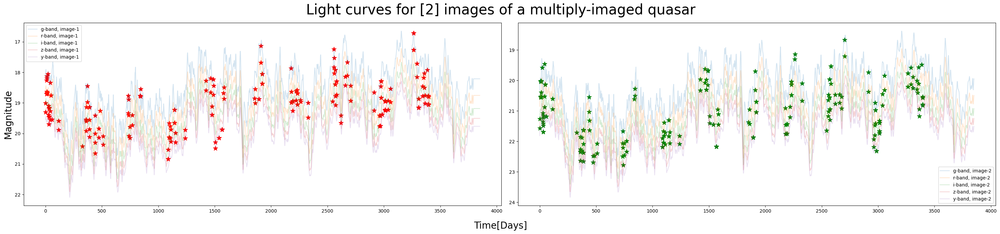

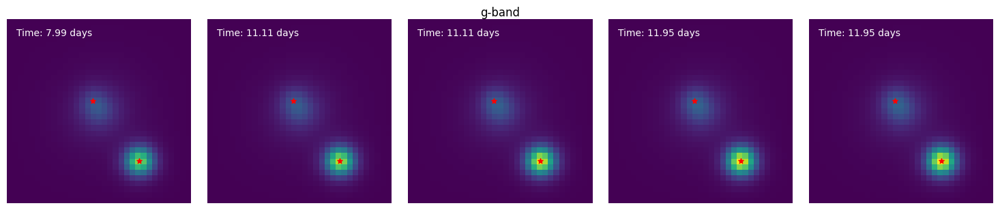

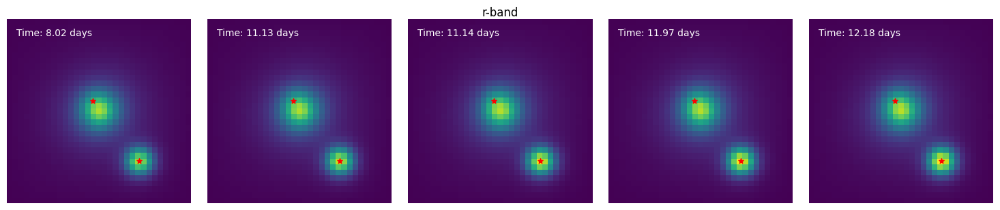

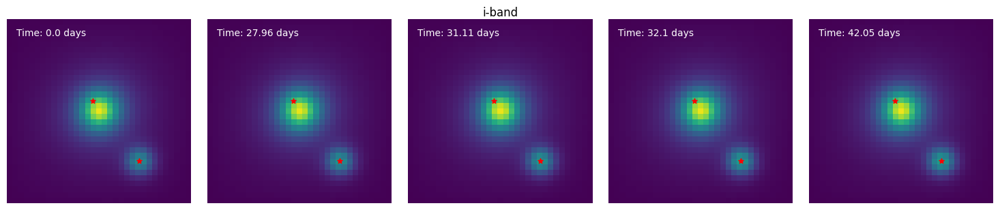

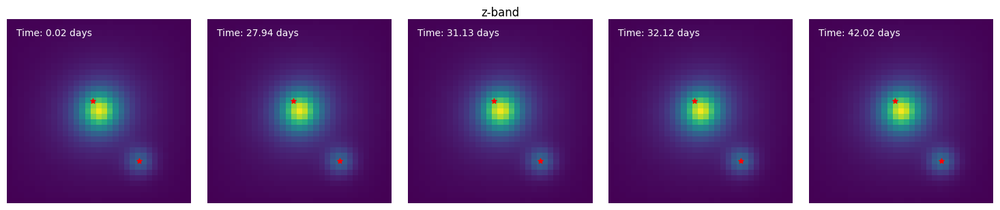

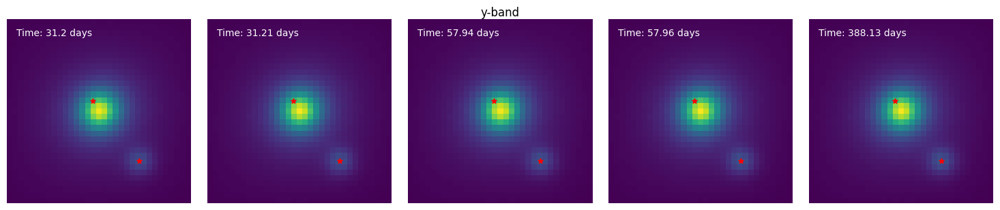

In [ ]:
# Get a point source coordinate so that you can plot these image center in the plot.
image_number = lens_class.image_number
if isinstance(image_number, list):
    image_number = image_number[
        0
    ]  ### taking the number of images from the first plane source
fig, ax = plt.subplots(1, image_number, figsize=(30, 7))
ax = ax.flatten()
colors = ["red", "green", "orange", "blue"]
for band in list("grizy"):
    time_sampled = np.array(
        observation_dates[band]
    )  # we're picking the dates that we expect to observe with Rubin
    # loop through the bands and plot the light curves
    for i in range(image_number):
        ax[i].plot(
            time,
            lens_class.point_source_magnitude(band=band, lensed=True, time=time)[0][i],
            label=f"{band}-band, image-{i+1}",
            alpha=0.2,
        )
        ax[i].scatter(
            time_sampled,
            lens_class.point_source_magnitude(
                band=band, lensed=True, time=time_sampled
            )[0][i],
            marker="*",
            s=100,
            color=colors[i],
        )

ax[0].set_ylabel("Magnitude", fontsize=20)
fig.supxlabel("Time" "[Days]", fontsize=20)
for a in ax:
    a.invert_yaxis()
    a.legend()
fig.suptitle(
    f"Light curves for {lens_class.image_number} images of a multiply-imaged quasar",
    fontsize=30,
)
fig.tight_layout()

# time = sorted(np.random.uniform(-20, 100, 10))
# time = np.array([0, 50, 70, 120])

# load your psf kernel and transform matrix. If you have your own psf, please provide
# it here.
path = "../../tests/TestData/psf_kernels_for_deflector.npy"
psf_kernel = 1 * np.load(path)
psf_kernel[psf_kernel < 0] = 0
transform_matrix = np.array([[delta_pix, 0], [0, delta_pix]])

# let's set up psf kernel for each exposure. Here we have taken the same psf that we
# extracted above. However, each exposure can have different psf kernel and user should
# provide corresponding psf kernel to each exposure.
psf_kernel_list = [psf_kernel]
transform_matrix_list = [transform_matrix]

# psf_kernels_all = np.array([dp0["psf_kernel"][:10]])[0]

# let's set pixel to angle transform matrix. Here we have taken the same matrix for
# each exposure but user should provide corresponding transform matrix to each exposure.


# provide magnitude zero point for each exposures. Here we have taken the same magnitude
#  zero point for each exposure but user should provide the corresponding magnitude
# zero point for each exposure.
for band in list("grizy"):
    time_sampled = observation_dates[band]
    # indices = np.linspace(0, len(time_sampled) - 1, 5).astype(int)
    # time_sampled = np.array([time_sampled[i] for i in indices])

    repeats = len(time_sampled)
    psf_kernels_all = psf_kernel_list * repeats
    transform_matrix_all = transform_matrix_list * repeats
    mag_list = [mag_zero_points_30_seconds[band]]
    mag_zero_points_all = mag_list * repeats
    # mag_zero_points_all = np.array([dp0["zero_point"][:10]])[0]

    expo_list = [exp_time]
    exposure_time_all = expo_list * repeats
    image_lens_series_all = lens_image_series(
        lens_class=lens_class,
        band=band,
        mag_zero_point=mag_zero_points_all,
        num_pix=num_pix,
        psf_kernel=psf_kernels_all,
        transform_pix2angle=transform_matrix_all,
        exposure_time=exposure_time_all,
        std_gaussian_noise=None,
        t_obs=time,
        with_deflector=True,
        with_ps=True,
        with_source=True,
        add_noise=True,
    )
    pix_coord = pix_coord_dict[band]["image_pix"]  # band r

    plot_montage = create_image_montage_from_image_list(
        num_rows=1,
        num_cols=5,
        images=image_lens_series_all,
        time=time_sampled,
        image_center=pix_coord,
    )
    plot_montage.suptitle(f"{band}-band", y=1.01)

### Make a GIF of difference images

In [ ]:
# Create a directory to store the frames
os.makedirs("frames", exist_ok=True)

# Generate and save the frames
frames = []
for i in range(len(image_lens_series_all)):
    diff_image = np.array(image_lens_series_all).mean(axis=0) - image_lens_series_all[i]
    # Set consistent vmin and vmax for all diff_image
    plt.imshow(diff_image, vmin=-50, vmax=50, origin="lower", cmap="viridis")
    plt.title(f"Day {time_sampled[i]}")
    plt.colorbar()
    frame_path = f"frames/frame_{i}.png"
    plt.savefig(frame_path)
    plt.close()
    frames.append(Image.open(frame_path))

# Save the frames as a gif
gif_path = "lens_series_diff.gif"
frames[0].save(
    gif_path,
    save_all=True,
    append_images=frames[1:],
    duration=200,
    loop=0,
)

# Clean up the frames directory
for frame in frames:
    os.remove(frame.filename)
os.rmdir("frames")
# plt.imshow(image_lens_series_all[1]-image_lens_series_all[0], origin='lower')
# plt.colorbar()

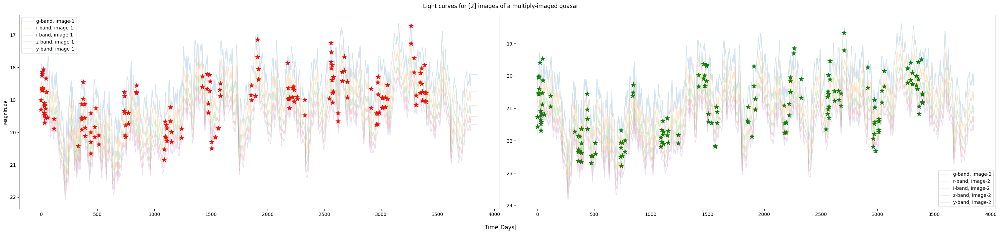

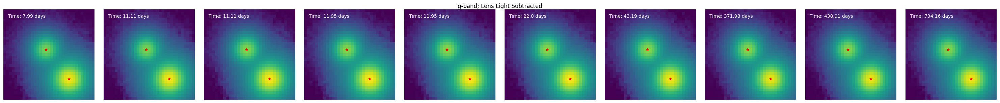

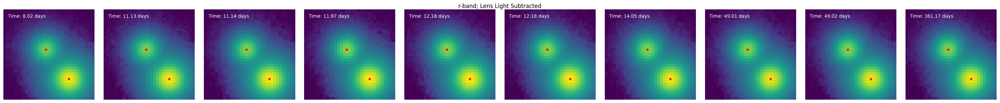

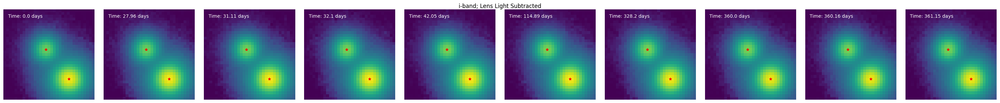

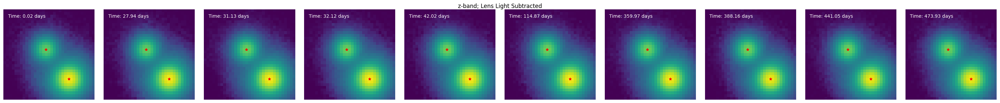

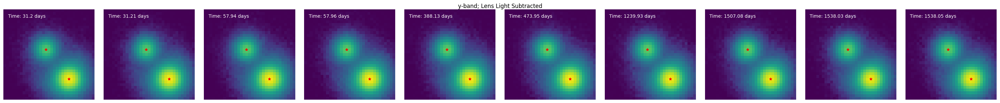

In [ ]:
# Get a point source coordinate so that you can plot these image center in the plot.
image_number = lens_class.image_number
if isinstance(image_number, list):
    image_number = image_number[
        0
    ]  ### taking the number of images from the first plane source
fig, ax = plt.subplots(1, image_number, figsize=(30, 7))
ax = ax.flatten()
colors = ["red", "green", "orange", "blue"]
for band in list("grizy"):
    time_sampled = np.array(
        observation_dates[band]
    )  # we're picking the dates that we expect to observe with Rubin
    # loop through the bands and plot the light curves
    for i in range(image_number):
        ax[i].plot(
            time,
            lens_class.point_source_magnitude(band=band, lensed=True, time=time)[0][i],
            label=f"{band}-band, image-{i+1}",
            alpha=0.2,
        )
        ax[i].scatter(
            time_sampled,
            lens_class.point_source_magnitude(
                band=band, lensed=True, time=time_sampled
            )[0][i],
            marker="*",
            s=100,
            color=colors[i],
        )

ax[0].set_ylabel("Magnitude")
fig.supxlabel("Time" "[Days]")
for a in ax:
    a.invert_yaxis()
    a.legend()
fig.suptitle(
    f"Light curves for {lens_class.image_number} images of a multiply-imaged quasar"
)
fig.tight_layout()

# time = sorted(np.random.uniform(-20, 100, 10))
# time = np.array([0, 50, 70, 120])

# load your psf kernel and transform matrix. If you have your own psf, please provide
# it here.
path = "../../tests/TestData/psf_kernels_for_deflector.npy"
psf_kernel = 1 * np.load(path)
psf_kernel[psf_kernel < 0] = 0
transform_matrix = np.array([[delta_pix, 0], [0, delta_pix]])

# let's set up psf kernel for each exposure. Here we have taken the same psf that we
# extracted above. However, each exposure can have different psf kernel and user should
# provide corresponding psf kernel to each exposure.
psf_kernel_list = [psf_kernel]
transform_matrix_list = [transform_matrix]

# psf_kernels_all = np.array([dp0["psf_kernel"][:10]])[0]

# let's set pixel to angle transform matrix. Here we have taken the same matrix for
# each exposure but user should provide corresponding transform matrix to each exposure.


# provide magnitude zero point for each exposures. Here we have taken the same magnitude
#  zero point for each exposure but user should provide the corresponding magnitude
# zero point for each exposure.
for band in list("grizy"):
    time_sampled = observation_dates[band]
    repeats = len(time_sampled)
    psf_kernels_all = psf_kernel_list * repeats
    transform_matrix_all = transform_matrix_list * repeats
    mag_list = [mag_zero_points_30_seconds[band]]
    mag_zero_points_all = mag_list * repeats
    # mag_zero_points_all = np.array([dp0["zero_point"][:10]])[0]

    expo_list = [exp_time]
    exposure_time_all = expo_list * repeats
    image_lens_series_all = lens_image_series(
        lens_class=lens_class,
        band=band,
        mag_zero_point=mag_zero_points_all,
        num_pix=num_pix,
        psf_kernel=psf_kernels_all,
        transform_pix2angle=transform_matrix_all,
        exposure_time=exposure_time_all,
        std_gaussian_noise=None,
        t_obs=time,
        with_deflector=False,
        with_ps=True,
        with_source=True,
        add_noise=True,
    )
    pix_coord = pix_coord_dict[band]["image_pix"]  # band r

    plot_montage = create_image_montage_from_image_list(
        num_rows=1,
        num_cols=10,
        images=image_lens_series_all,
        time=time_sampled,
        image_center=pix_coord,
    )
    plot_montage.suptitle(f"{band}-band; Lens Light Subtracted", y=1.01)

In [ ]:
pix_coord_list

[{'deflector_pix': array([16.15877811, 15.85528625]),
  'image_pix': [array([ 7.17817198, 20.77062596]),
   array([16.70431346, 15.20704117])],
  'ra_image': array([-1.7643656 ,  0.14086269]),
  'dec_image': array([ 0.95412519, -0.15859177])},
 {'deflector_pix': array([16.15877811, 15.85528625]),
  'image_pix': [array([ 7.17817198, 20.77062596]),
   array([16.70431346, 15.20704117])],
  'ra_image': array([-1.7643656 ,  0.14086269]),
  'dec_image': array([ 0.95412519, -0.15859177])},
 {'deflector_pix': array([16.15877811, 15.85528625]),
  'image_pix': [array([ 7.17817198, 20.77062596]),
   array([16.70431346, 15.20704117])],
  'ra_image': array([-1.7643656 ,  0.14086269]),
  'dec_image': array([ 0.95412519, -0.15859177])},
 {'deflector_pix': array([16.15877811, 15.85528625]),
  'image_pix': [array([ 7.17817198, 20.77062596]),
   array([16.70431346, 15.20704117])],
  'ra_image': array([-1.7643656 ,  0.14086269]),
  'dec_image': array([ 0.95412519, -0.15859177])},
 {'deflector_pix': array

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
ax1.plot(
    time,
    lens_class.point_source_magnitude(band="i", lensed=True, time=time)[0][0],
    label="i-band, image-1",
)
ax1.plot(
    time,
    lens_class.point_source_magnitude(band="r", lensed=True, time=time)[0][0],
    label="r-band, image-1",
)
ax1.plot(
    time,
    lens_class.point_source_magnitude(band="g", lensed=True, time=time)[0][0],
    label="g-band, image-1",
)
# ax1.gca().invert_yaxis()
ax1.set_ylabel("Magnitude")
ax1.set_xlabel("Time" "[Days]")
# ax1.set_xlim(0, 500)
# ax1.set_ylim(19.5, 21.25)
ax2.plot(
    time,
    lens_class.point_source_magnitude(band="i", lensed=True, time=time)[0][1],
    label="i-band, image-2",
)
ax2.plot(
    time,
    lens_class.point_source_magnitude(band="r", lensed=True, time=time)[0][1],
    label="r-band, image-2",
)
ax2.plot(
    time,
    lens_class.point_source_magnitude(band="g", lensed=True, time=time)[0][1],
    label="g-band, image-2",
)
# ax1.gca().invert_yaxis()
ax2.set_ylabel("Magnitude")
ax2.set_xlabel("Time" "[Days]")
# ax2.set_xlim(0, 250)
# ax2.set_ylim(None, 25)
ax2.invert_yaxis()
ax1.invert_yaxis()
ax1.legend()
ax2.legend()

## Set observation time and image configuration

In [ ]:
time = np.linspace(0, 250, 10)
# time = sorted(np.random.uniform(-20, 100, 10))
# time = np.array([0, 50, 70, 120])
repeats = len(time)
# load your psf kernel and transform matrix. If you have your own psf, please provide
# it here.
path = "../tests/TestData/psf_kernels_for_deflector.npy"
psf_kernel = 1 * np.load(path)
psf_kernel[psf_kernel < 0] = 0
transform_matrix = np.array([[0.2, 0], [0, 0.2]])

# let's set up psf kernel for each exposure. Here we have taken the same psf that we
# extracted above. However, each exposure can have different psf kernel and user should
# provide corresponding psf kernel to each exposure.
psf_kernel_list = [psf_kernel]
transform_matrix_list = [transform_matrix]
psf_kernels_all = psf_kernel_list * repeats
# psf_kernels_all = np.array([dp0["psf_kernel"][:10]])[0]

# let's set pixel to angle transform matrix. Here we have taken the same matrix for
# each exposure but user should provide corresponding transform matrix to each exposure.
transform_matrix_all = transform_matrix_list * repeats

# provide magnitude zero point for each exposures. Here we have taken the same magnitude
#  zero point for each exposure but user should provide the corresponding magnitude
# zero point for each exposure.
mag_list = [31.0]
mag_zero_points_all = mag_list * repeats
# mag_zero_points_all = np.array([dp0["zero_point"][:10]])[0]

expo_list = [30]
exposure_time_all = expo_list * repeats

## Simulate Image

In [ ]:
# Simulate a lens image
image_lens_series_i = lens_image_series(
    lens_class=lens_class,
    band="i",
    mag_zero_point=mag_zero_points_all,
    num_pix=64,
    psf_kernel=psf_kernels_all,
    transform_pix2angle=transform_matrix_all,
    exposure_time=exposure_time_all,
    t_obs=time,
    with_deflector=True,
    with_source=True,
)
image_lens_series_g = lens_image_series(
    lens_class=lens_class,
    band="g",
    mag_zero_point=mag_zero_points_all,
    num_pix=64,
    psf_kernel=psf_kernels_all,
    transform_pix2angle=transform_matrix_all,
    exposure_time=exposure_time_all,
    t_obs=time,
    with_deflector=True,
    with_source=True,
)
image_lens_series_r = lens_image_series(
    lens_class=lens_class,
    band="r",
    mag_zero_point=mag_zero_points_all,
    num_pix=64,
    psf_kernel=psf_kernels_all,
    transform_pix2angle=transform_matrix_all,
    exposure_time=exposure_time_all,
    t_obs=time,
    with_deflector=True,
    with_source=True,
)

In [ ]:
rgb_image_list = []
for i in range(len(image_lens_series_i)):
    rgb_image_list.append(
        rgb_image_from_image_list(
            image_list=[
                image_lens_series_i[i],
                image_lens_series_r[i],
                image_lens_series_g[i],
            ],
            stretch=0.5,
        )
    )

## Visualize simulated images

In [ ]:
plot_montage = create_image_montage_from_image_list(
    num_rows=2, num_cols=5, images=rgb_image_list, time=time, image_center=pix_coord
)

### Graveyard

In [ ]:
# image_lens_series_lens_only = lens_image_series(
#     lens_class=lens_class,
#     band="i",
#     mag_zero_point=mag_zero_points_all,
#     num_pix=num_pix,
#     psf_kernel=[None] * repeats,
#     transform_pix2angle=transform_matrix_all,
#     exposure_time=exposure_time_all,
#     std_gaussian_noise=None,
#     t_obs=time,
#     with_deflector=True,
#     with_ps=False,
#     with_source=False,
#     add_noise=False,
# )
# image_lens_series_ps_only = lens_image_series(
#     lens_class=lens_class,
#     band="i",
#     mag_zero_point=mag_zero_points_all,
#     num_pix=num_pix,
#     psf_kernel=[None] * repeats,
#     transform_pix2angle=transform_matrix_all,
#     exposure_time=exposure_time_all,
#     std_gaussian_noise=None,
#     t_obs=time,
#     with_deflector=False,
#     with_ps=True,
#     with_source=False,
#     add_noise=False,
# )
# image_lens_series_src_only = lens_image_series(
#     lens_class=lens_class,
#     band="i",
#     mag_zero_point=mag_zero_points_all,
#     num_pix=num_pix,
#     psf_kernel=[None] * repeats,
#     transform_pix2angle=transform_matrix_all,
#     exposure_time=exposure_time_all,
#     std_gaussian_noise=None,
#     t_obs=time,
#     with_deflector=False,
#     with_ps=False,
#     with_source=True,
#     add_noise=False,
# )

In [ ]:
# plot_montage = create_image_montage_from_image_list(
#     num_rows=1,
#     num_cols=5,
#     images=image_lens_series_lens_only,
#     time=time_sampled,
#     image_center=pix_coord,
# )
# plot_montage.suptitle("Only Lens Light", y=1.01)

# plot_montage = create_image_montage_from_image_list(
#     num_rows=1,
#     num_cols=5,
#     images=image_lens_series_ps_only,
#     time=time_sampled,
#     image_center=pix_coord,
# )
# plot_montage.suptitle("Lens Light Subtracted", y=1.01)

# plot_montage = create_image_montage_from_image_list(
#     num_rows=1,
#     num_cols=5,
#     images=image_lens_series_src_only,
#     time=time_sampled,
#     image_center=pix_coord,
# )
# plot_montage.suptitle("Lens and AGN Light Subtracted", y=1.01)